# PK-PD Elimination Equation: Paper Plots

This notebook generates plots for the paper, focusing on specific drugs.

**Equation:**
```
R(C₀, t) = R₀ + Emax * (1 - exp(-κ * (C₀/Cmax * exp(-k_elim * t))^n * (t/τ)^m))
```

**Features:**
- Loads PK-PD Elimination coefficients from Excel
- Filters to specific drugs for individual plots
- Shows preview plots of all drugs in categories
- Generates 2D plots for specific drugs
- Saves all plots at the end

**Specific Drugs:**
- Chloropromazine, cobimetinib, epirubicin, vandetanib, Sunitinib, panobinostat, Dactinomycin, Erlotinib, Etomoxir, Plicamycin, Daunorubicin, Doxorubicin


In [20]:
# Dependencies: None (initial setup cell)
# Cell 1: Imports and Setup
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')

# Find project root - look for EQN_Coefficients directory (current workspace structure)
current_dir = Path.cwd()

# Strategy 1: Check if we're in Prediction_Models directory
if current_dir.name == 'Prediction_Models':
    PROJECT_ROOT = current_dir.parent
# Strategy 2: Check if EQN_Coefficients exists in current directory
elif (current_dir / 'EQN_Coefficients').exists():
    PROJECT_ROOT = current_dir
# Strategy 3: Check if EQN_Coefficients exists one level up
elif (current_dir.parent / 'EQN_Coefficients').exists():
    PROJECT_ROOT = current_dir.parent
# Strategy 4: Check if we're in a subdirectory and need to go up
elif (current_dir.parent.parent / 'EQN_Coefficients').exists():
    PROJECT_ROOT = current_dir.parent.parent
else:
    # Default: assume current directory is project root
    PROJECT_ROOT = current_dir

# Define paths
EXCEL_PATH = PROJECT_ROOT / 'EQN_Coefficients' / 'all_equations_coefficients.xlsx'
OUTPUT_DIR = PROJECT_ROOT / 'Output' / '3D_Plots'
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

print("Setup complete!")
print(f"Project root: {PROJECT_ROOT}")
print(f"Excel path: {EXCEL_PATH}")
print(f"Excel file exists: {EXCEL_PATH.exists()}")
print(f"Output directory: {OUTPUT_DIR}")


Setup complete!
Project root: c:\Users\NoahB\Documents\HebrewU Bioengineering\Cardiac_RODEO
Excel path: c:\Users\NoahB\Documents\HebrewU Bioengineering\Cardiac_RODEO\EQN_Coefficients\all_equations_coefficients.xlsx
Excel file exists: True
Output directory: c:\Users\NoahB\Documents\HebrewU Bioengineering\Cardiac_RODEO\Output\3D_Plots


## Step 1: Load and Filter Data

Load the PK-PD Elimination coefficients from Excel and filter drugs.


In [21]:
# Cell 2: Load and Filter Data
print("="*80)
print("LOADING PK-PD ELIMINATION DATA")
print("="*80)

# Load data from Excel (skip first header row)
df_raw = pd.read_excel(EXCEL_PATH, sheet_name='pkpd_elimination', header=1)

# Clean column names
df_raw.columns = df_raw.columns.str.strip()

# Remove rows with missing Drug names
df_raw = df_raw[df_raw['Drug'].notna() & (df_raw['Drug'].astype(str).str.strip() != '')]

print(f"\nLoaded data: {len(df_raw)} drugs")
print(f"Columns: {len(df_raw.columns)}")
print(f"\nColumn names:")
print(df_raw.columns.tolist())


LOADING PK-PD ELIMINATION DATA

Loaded data: 25 drugs
Columns: 24

Column names:
['Drug', 'Arrhythmia', 'Cardiotoxicity', 'Concern', 'R0', 'Emax', 'kappa', 'n', 'm', 'tau', 'k_elim', 'Cmax_used', 'R2', 'N_points', 'R0.1', 'Emax.1', 'kappa.1', 'n.1', 'm.1', 'tau.1', 'k_elim.1', 'Cmax_used.1', 'R2.1', 'N_points.1']


In [22]:
# Dependencies: Cell 1 (imports), Cell 3 (data loading)
# Cell 3b: Define Specific Drugs List for Paper Analysis (OPTIONAL)
# If this cell is not run, all drugs will be used. If run, Cell 3c will filter to these drugs.
# Specific drugs for paper
specific_drugs = ['Chloropromazine', 'cobimetinib', 'epirubicin', 'vandetanib',
                  'Sunitinib', 'panobinostat', 'Dactinomycin', 'Erlotinib',
                  'Etomoxir', 'Plicamycin', 'Daunorubicin', 'Doxorubicin']

# Clean column names
df_raw.columns = df_raw.columns.str.strip()

# Remove rows with missing Drug names
df_raw = df_raw[df_raw['Drug'].notna() & (df_raw['Drug'].astype(str).str.strip() != '')]

print("FILTERING TO SPECIFIC DRUGS FOR PAPER ANALYSIS")
print("="*80)

# Normalize drug names for matching
def normalize_name(s):
    """Normalize drug name for matching"""
    if pd.isna(s):
        return ''
    return str(s).lower().replace(' ', '').replace('(', '').replace(')', '')

# Filter df_raw to only specific drugs (OVERWRITES df_raw - all subsequent cells will use filtered data)
original_count = len(df_raw)
df_raw = df_raw[
    df_raw['Drug'].apply(lambda x: normalize_name(str(x)) in [normalize_name(d) for d in specific_drugs])
].copy()

print(f"\nFiltered data: {len(df_raw)} drugs out of {original_count} total")
if len(df_raw) > 0:
    print(f"Filtered drugs: {', '.join(df_raw['Drug'].astype(str).tolist())}")
print("\nNote: df_raw has been overwritten with filtered data. All subsequent cells will use only these filtered drugs.")
print("      If you want to use all drugs, skip this cell and df_raw will contain all drugs.")


FILTERING TO SPECIFIC DRUGS FOR PAPER ANALYSIS

Filtered data: 11 drugs out of 25 total
Filtered drugs: Doxorubicin, Epirubicin, Panobinostat, Sunitinib, Vandetanib, Cobimetinib, Daunorubicin, Dactinomycin, Erlotinib, Etomoxir, Plicamycin

Note: df_raw has been overwritten with filtered data. All subsequent cells will use only these filtered drugs.
      If you want to use all drugs, skip this cell and df_raw will contain all drugs.


## Step 2: Extract Coefficients and Separate by Response Type

Extract Contractility and O2 coefficients from the data.


In [23]:
# Cell 3: Extract Coefficients for Contractility and O2
print("="*80)
print("EXTRACTING COEFFICIENTS")
print("="*80)

# Parameter names
param_names = ['R0', 'Emax', 'kappa', 'n', 'm', 'tau', 'k_elim']

# Function to extract coefficients for a response type
def extract_coefficients(df, response_type):
    """
    Extract coefficients for Contractility or O2 response type.
    
    Parameters:
    -----------
    df : pd.DataFrame
        Raw data with coefficients
    response_type : str
        'Contractility' or 'O2'
        
    Returns:
    --------
    pd.DataFrame
        DataFrame with extracted coefficients and metadata
    """
    # Base columns to keep (only include columns that exist)
    base_cols = ['Drug', 'Arrhythmia', 'Cardiotoxicity', 'Concern']
    # Add DrugKey if it exists (it's optional, used for filtering)
    if 'DrugKey' in df.columns:
        base_cols.append('DrugKey')
    
    if response_type == 'Contractility':
        # Use first set of parameters (no suffix)
        param_cols = param_names.copy()
    else:  # O2
        # Use parameters with .1 suffix (Excel auto-renaming)
        param_cols = [f'{p}.1' if f'{p}.1' in df.columns else f'{p}_1' for p in param_names]
    
    # Check which columns exist
    available_cols = []
    for col in param_cols:
        if col in df.columns:
            available_cols.append(col)
        else:
            # Try alternative naming
            alt_cols = [c for c in df.columns if c.startswith(col.split('.')[0])]
            if alt_cols:
                available_cols.append(alt_cols[-1])  # Use last match (should be O2)
            else:
                print(f"Warning: Could not find column for {col}")
    
    # Get Cmax column
    cmax_col = None
    for cand in ['Cmax_used', 'Cmax_used.1', 'Cmax_phys_uM', 'Cmax_uM', 'Cmax']:
        if cand in df.columns:
            cmax_col = cand
            break
    
    # Create result dataframe
    result = df[base_cols].copy()
    
    # Add parameters with standard names
    for i, param in enumerate(param_names):
        if i < len(available_cols):
            result[param] = df[available_cols[i]]
        else:
            result[param] = np.nan
    
    # Add Cmax
    if cmax_col:
        result['Cmax_used'] = df[cmax_col]
    else:
        result['Cmax_used'] = 1.0
        print("Warning: Cmax column not found, using default Cmax=1.0")
    
    return result

# Extract for both response types
df_contractility = extract_coefficients(df_raw, 'Contractility')
df_o2 = extract_coefficients(df_raw, 'O2')

print(f"\nContractility data: {len(df_contractility)} drugs")
print(f"O2 data: {len(df_o2)} drugs")

# Check for valid coefficients
def count_valid_coefficients(df):
    """Count drugs with valid (finite) coefficients"""
    valid = df[param_names].notna().all(axis=1) & df[param_names].apply(lambda x: np.isfinite(x)).all(axis=1)
    return valid.sum()

print(f"\nValid Contractility coefficients: {count_valid_coefficients(df_contractility)}")
print(f"Valid O2 coefficients: {count_valid_coefficients(df_o2)}")


EXTRACTING COEFFICIENTS

Contractility data: 11 drugs
O2 data: 11 drugs

Valid Contractility coefficients: 11
Valid O2 coefficients: 11


## Step 3: PK-PD Elimination Equation Function

Define the function to calculate the response surface.


In [24]:
# Cell 4: PK-PD Elimination Equation Function
def pkpd_elimination_response(dose_ratio, time, R0, Emax, kappa, n, m, tau, k_elim):
    """
    Calculate PKPD elimination response.
    
    Parameters:
    -----------
    dose_ratio : array-like
        Dose ratio (C₀/Cmax), typically 0 to 2
    time : array-like
        Time (hours), typically 0 to 96
    R0 : float
        Baseline response
    Emax : float
        Maximum effect amplitude
    kappa : float
        Potency parameter
    n : float
        Hill coefficient for concentration
    m : float
        Hill coefficient for time
    tau : float
        Time scale (hours)
    k_elim : float
        Elimination rate constant (1/hours)
        
    Returns:
    --------
    array-like
        Response values R(C₀, t)
    """
    # Ensure arrays are numpy arrays
    dose_ratio = np.asarray(dose_ratio)
    time = np.asarray(time)
    
    # Create meshgrid if inputs are 1D
    if dose_ratio.ndim == 1 and time.ndim == 1:
        dose_ratio, time = np.meshgrid(dose_ratio, time)
    
    # Ensure positive values to avoid numerical issues
    kappa = max(kappa, 1e-9)
    tau = max(tau, 1e-9)
    k_elim = max(k_elim, 1e-9)
    time = np.maximum(time, 1e-9)
    
    # Concentration decays over time: C(t)/Cmax = (C₀/Cmax) * exp(-k_elim * t)
    C_norm = dose_ratio * np.exp(-k_elim * time)
    
    # Time component: (t/τ)^m
    time_component = (time / tau) ** m
    
    # Concentration component: (C_norm)^n
    conc_component = C_norm ** n
    
    # Combined: κ * (C_norm)^n * (t/τ)^m
    combined = kappa * conc_component * time_component
    
    # Full equation: R = R₀ + Emax * (1 - exp(-combined))
    response = R0 + Emax * (1 - np.exp(-combined))
    
    return response

print("PK-PD Elimination equation function defined!")


PK-PD Elimination equation function defined!


## Step 4: Plotting Functions

Define functions to create individual plots and overlay plots.


In [25]:
# Dependencies: Cell 1 (imports), Cell 3 (extract_coefficients), Cell 7 (pkpd_elimination_response)
# Cell 5: Plotting Functions

def calculate_global_response_range(df, response_type):
    """
    Calculate global min/max response values across all drugs for consistent color scaling.
    
    Parameters:
    -----------
    df : pd.DataFrame
        DataFrame with coefficients
    response_type : str
        'Contractility' or 'O2'
        
    Returns:
    --------
    tuple
        (vmin, vmax) for color scaling
    """
    # Create coordinate grids
    dose_ratio = np.linspace(0, 2, 60)
    time = np.linspace(0, 96, 60)
    T, Dr = np.meshgrid(time, dose_ratio)
    
    all_responses = []
    
    for idx in df.index:
        row = df.loc[idx]
        R0 = row['R0']
        Emax = row['Emax']
        kappa = row['kappa']
        n = row['n']
        m = row['m']
        tau = row['tau']
        k_elim = row['k_elim']
        
        # Skip if invalid
        if not all(np.isfinite([R0, Emax, kappa, n, m, tau, k_elim])):
            continue
        
        # Calculate response
        Response = pkpd_elimination_response(Dr, T, R0, Emax, kappa, n, m, tau, k_elim)
        all_responses.append(Response)
    
    if not all_responses:
        # Default ranges if no valid responses
        if response_type == 'O2':
            return (0, 100)
        else:
            return (0, 0.2)
    
    # Find global min/max
    all_responses_array = np.concatenate([r.flatten() for r in all_responses])
    vmin = np.nanmin(all_responses_array)
    vmax = np.nanmax(all_responses_array)
    
    # Ensure reasonable bounds
    if response_type == 'O2':
        vmin = max(0, vmin)
        vmax = min(100, vmax)
    else:
        vmin = max(0, vmin)
        vmax = min(0.2, vmax)
    
    return (vmin, vmax)

def plot_individual_surface(df, drug_idx, response_type, ax=None, show_title=True, vmin=None, vmax=None):
    """
    Plot individual 3D surface for a single drug.
    
    Parameters:
    -----------
    df : pd.DataFrame
        DataFrame with coefficients
    drug_idx : int
        Index of drug in dataframe
    response_type : str
        'Contractility' or 'O2'
    ax : matplotlib.axes.Axes3D, optional
        Axes to plot on (creates new figure if None)
    show_title : bool
        Whether to show title
        
    Returns:
    --------
    matplotlib.axes.Axes3D
        The axes object
    """
    # Extract parameters
    row = df.loc[drug_idx]  # Use .loc since drug_idx is the actual dataframe index, not positional
    drug_name = str(row['Drug'])
    
    R0 = row['R0']
    Emax = row['Emax']
    kappa = row['kappa']
    n = row['n']
    m = row['m']
    tau = row['tau']
    k_elim = row['k_elim']
    Cmax = row['Cmax_used'] if 'Cmax_used' in row else 1.0
    
    # Check for invalid values
    if not all(np.isfinite([R0, Emax, kappa, n, m, tau, k_elim])):
        if ax is None:
            fig = plt.figure(figsize=(8, 6))
            ax = fig.add_subplot(111, projection='3d')
        ax.text(0.5, 0.5, 0.5, f'{drug_name}\nInvalid coefficients', 
                ha='center', va='center', transform=ax.transAxes)
        ax.set_axis_off()
        return ax
    
    # Create coordinate grids
    dose_ratio = np.linspace(0, 2, 60)  # Dose/Cmax ratio: 0 to 2
    time = np.linspace(0, 96, 60)  # Time: 0 to 96 hours
    T, Dr = np.meshgrid(time, dose_ratio)  # Time on X-axis, Dose/Cmax on Y-axis
    
    # Calculate response
    Response = pkpd_elimination_response(Dr, T, R0, Emax, kappa, n, m, tau, k_elim)
    
    # Clip to reasonable range
    if response_type == 'O2':
        Response = np.clip(Response, 0, 100)
        z_range = [0, 100]
        z_label = 'O₂ (%)'
    else:
        Response = np.clip(Response, 0, 0.2)
        z_range = [0, 0.2]
        z_label = 'Contractility'
    
    # Create or use existing axes
    if ax is None:
        fig = plt.figure(figsize=(10, 8))
        ax = fig.add_subplot(111, projection='3d')
    
    # Plot surface (T (Time) on X-axis, Dr (Dose/Cmax) on Y-axis)
    # Use consistent color scale if vmin/vmax provided
    if vmin is not None and vmax is not None:
        from matplotlib.colors import Normalize
        norm = Normalize(vmin=vmin, vmax=vmax)
        surf = ax.plot_surface(T, Dr, Response, cmap='turbo', alpha=0.8, 
                              linewidth=0, antialiased=True, edgecolor='none',
                              norm=norm)
    else:
        surf = ax.plot_surface(T, Dr, Response, cmap='turbo', alpha=0.8, 
                              linewidth=0, antialiased=True, edgecolor='none')
    
    # Set view angle (matching MATLAB: -158, 25)
    ax.view_init(elev=25, azim=-158)
    
    # Labels and limits
    ax.set_xlabel('Time (h)', fontsize=10)
    ax.set_ylabel('Dose/Cmax (ratio)', fontsize=10)
    ax.set_zlabel(z_label, fontsize=10)
    ax.set_xlim(0, 96)  # Time: 0 to 96
    ax.set_ylim(0, 2)   # Dose/Cmax: 0 to 2
    ax.set_zlim(z_range)
    
    # Title
    if show_title:
        title = f'{drug_name} (Cmax={Cmax:.2f})'
        ax.set_title(title, fontsize=11, pad=10)
    
    # Grid
    ax.grid(True, alpha=0.3)
    
    return ax

## Step 5: Preview Individual Contractility Plots

Preview a few sample individual Contractility plots before saving all plots.


### Important: Update All Plotting Cells

**For each plotting cell, replace:**
```python
if save_plots:
    # ... filename generation ...
    plt.savefig(output_path, dpi=300, bbox_inches='tight')
    print(f"  Saved: {output_path.name}")

plt.close()
```

**With:**
```python
# Store plot for saving later
# ... filename generation ...
store_plot(fig, output_path)
```

This applies to:
- Individual Contractility plots (Cell 14)
- Individual O2 plots (Cell 16)
- Overlay Contractility plots (Cell 22)
- Overlay O2 plots (Cell 24)
- Projection Contractility plots (Cell 33)
- Projection O2 plots (Cell 34)


In [26]:
# Initialize list to store all plots for saving at the end
plots_to_save = []  # List of (figure, filename) tuples

# Helper function to store plots
def store_plot(fig, filename):
    """Store a figure for later saving"""
    plots_to_save.append((fig, filename))

print("Plot storage initialized. All plots will be saved at the end.")
print("Note: Modify all plotting cells to use 'store_plot(fig, output_path)' instead of 'plt.savefig()' and remove 'plt.close()'")


Plot storage initialized. All plots will be saved at the end.
Note: Modify all plotting cells to use 'store_plot(fig, output_path)' instead of 'plt.savefig()' and remove 'plt.close()'


In [27]:
# Cell 7: Filter Valid Drugs and Group by Categories
def filter_valid_drugs(df):
    """Filter drugs with valid (finite) coefficients"""
    param_cols = ['R0', 'Emax', 'kappa', 'n', 'm', 'tau', 'k_elim']
    valid_mask = df[param_cols].notna().all(axis=1) & df[param_cols].apply(lambda x: np.isfinite(x)).all(axis=1)
    return df[valid_mask].copy()

def group_by_categories(df):
    """
    Group drugs by categories.
    
    Returns:
    --------
    dict
        Dictionary with category groups
    """
    groups = {}
    
    # Convert boolean columns to strings for consistency
    df = df.copy()
    if df['Arrhythmia'].dtype == bool:
        df['Arrhythmia'] = df['Arrhythmia'].map({True: 'True', False: 'False'})
    if df['Cardiotoxicity'].dtype == bool:
        df['Cardiotoxicity'] = df['Cardiotoxicity'].map({True: 'True', False: 'False'})
    
    # Group by Arrhythmia
    groups['Arrhythmia'] = {}
    for val in df['Arrhythmia'].unique():
        if pd.notna(val):
            groups['Arrhythmia'][val] = df[df['Arrhythmia'] == val].index.tolist()
    
    # Group by Cardiotoxicity
    groups['Cardiotoxicity'] = {}
    for val in df['Cardiotoxicity'].unique():
        if pd.notna(val):
            groups['Cardiotoxicity'][val] = df[df['Cardiotoxicity'] == val].index.tolist()
    
    # Group by Concern
    groups['Concern'] = {}
    for val in df['Concern'].unique():
        if pd.notna(val):
            groups['Concern'][val] = df[df['Concern'] == val].index.tolist()
    
    return groups

# Filter valid drugs
df_contractility_valid = filter_valid_drugs(df_contractility)
df_o2_valid = filter_valid_drugs(df_o2)

print("="*80)
print("VALID DRUGS SUMMARY")
print("="*80)
print(f"\nContractility - Valid: {len(df_contractility_valid)}, Total: {len(df_contractility)}")
print(f"O2 - Valid: {len(df_o2_valid)}, Total: {len(df_o2)}")

# Note: Data was already filtered to specific drugs in Cell 3 before coefficient extraction
# All subsequent analysis will use only the filtered drugs

# Calculate global response ranges for consistent color scaling (using filtered data)
print("\n" + "="*80)
print("CALCULATING GLOBAL RESPONSE RANGES FOR CONSISTENT COLOR SCALING")
print("="*80)
contractility_vmin, contractility_vmax = calculate_global_response_range(df_contractility_valid, 'Contractility')
o2_vmin, o2_vmax = calculate_global_response_range(df_o2_valid, 'O2')
print(f"\nContractility global range: [{contractility_vmin:.6f}, {contractility_vmax:.6f}]")
print(f"O2 global range: [{o2_vmin:.6f}, {o2_vmax:.6f}]")
print("\nAll plots will use these ranges for consistent color scaling.")

# Group by categories (using filtered data)
contractility_groups = group_by_categories(df_contractility_valid)
o2_groups = group_by_categories(df_o2_valid)

print("\nContractility Categories:")
for cat_type, cat_dict in contractility_groups.items():
    print(f"  {cat_type}:")
    for cat_val, indices in cat_dict.items():
        print(f"    {cat_val}: {len(indices)} drugs")

print("\nO2 Categories:")
for cat_type, cat_dict in o2_groups.items():
    print(f"  {cat_type}:")
    for cat_val, indices in cat_dict.items():
        print(f"    {cat_val}: {len(indices)} drugs")


VALID DRUGS SUMMARY

Contractility - Valid: 11, Total: 11
O2 - Valid: 11, Total: 11

CALCULATING GLOBAL RESPONSE RANGES FOR CONSISTENT COLOR SCALING



Contractility global range: [0.054216, 0.138404]
O2 global range: [9.691644, 68.414143]

All plots will use these ranges for consistent color scaling.

Contractility Categories:
  Arrhythmia:
    True: 5 drugs
    False: 6 drugs
  Cardiotoxicity:
    True: 7 drugs
    False: 4 drugs
  Concern:
    most: 7 drugs
    no: 4 drugs

O2 Categories:
  Arrhythmia:
    True: 5 drugs
    False: 6 drugs
  Cardiotoxicity:
    True: 7 drugs
    False: 4 drugs
  Concern:
    most: 7 drugs
    no: 4 drugs


## Step 6: Preview individual O2 and Contractility Plots

Preview a few sample individual O2 and Contractility plots before saving all plots.


PREVIEW: SAMPLE INDIVIDUAL CONTRACTILITY PLOTS

Showing preview of 3 Contractility plots:


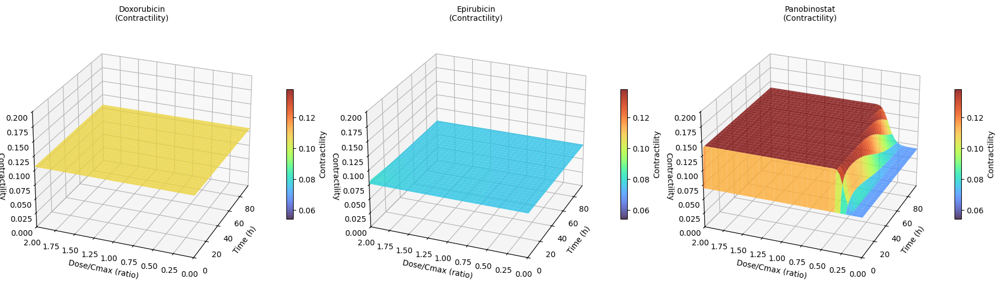


Preview complete. Will save 11 individual Contractility plots (stored for saving) next.

PREVIEW: SAMPLE INDIVIDUAL O2 PLOTS

Showing preview of 3 O2 plots:


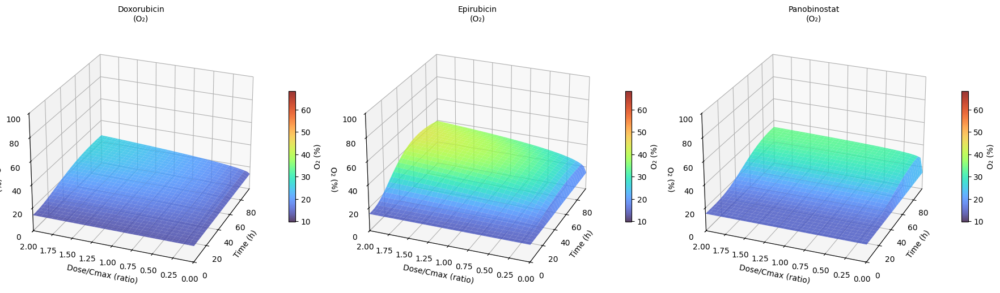


Preview complete. Will save 11 individual O2 plots (stored for saving) next.


In [28]:
# Dependencies: Cell 1 (imports), Cell 3 (extract_coefficients), Cell 7 (pkpd_elimination_response), Cell 9 (plot_individual_surface), Cell 15 (filtering)
# Cell 16: Preview Individual Plots (Contractility and O2)
print("="*80)
print("PREVIEW: SAMPLE INDIVIDUAL CONTRACTILITY PLOTS")
print("="*80)

# Show first 3 Contractility plots as preview
num_preview = min(3, len(df_contractility_valid))
print(f"\nShowing preview of {num_preview} Contractility plots:")

fig, axes = plt.subplots(1, num_preview, figsize=(6*num_preview, 5), 
                         subplot_kw={'projection': '3d'})

if num_preview == 1:
    axes = [axes]

for i, idx in enumerate(df_contractility_valid.index[:num_preview]):
    drug_name = str(df_contractility_valid.loc[idx, 'Drug'])
    plot_individual_surface(df_contractility_valid, idx, 'Contractility', ax=axes[i], 
                           vmin=contractility_vmin, vmax=contractility_vmax)
    
    # Add colorbar
    surf = axes[i].collections[0] if axes[i].collections else None
    if surf:
        fig.colorbar(surf, ax=axes[i], shrink=0.5, aspect=20, label='Contractility')
    
    axes[i].set_title(f'{drug_name}\n(Contractility)', fontsize=10)

plt.tight_layout()
plt.show()
plt.close(fig)  # Close preview figure to free memory
print(f"\nPreview complete. Will save {len(df_contractility_valid)} individual Contractility plots (stored for saving) next.")

# Preview: Sample Individual O2 Plots
print("\n" + "="*80)
print("PREVIEW: SAMPLE INDIVIDUAL O2 PLOTS")
print("="*80)

# Show first 3 O2 plots as preview
num_preview = min(3, len(df_o2_valid))
print(f"\nShowing preview of {num_preview} O2 plots:")

fig, axes = plt.subplots(1, num_preview, figsize=(6*num_preview, 5), 
                         subplot_kw={'projection': '3d'})

if num_preview == 1:
    axes = [axes]

for i, idx in enumerate(df_o2_valid.index[:num_preview]):
    drug_name = str(df_o2_valid.loc[idx, 'Drug'])
    plot_individual_surface(df_o2_valid, idx, 'O2', ax=axes[i], vmin=o2_vmin, vmax=o2_vmax)
    
    # Add colorbar
    surf = axes[i].collections[0] if axes[i].collections else None
    if surf:
        fig.colorbar(surf, ax=axes[i], shrink=0.5, aspect=20, label='O₂ (%)')
    
    axes[i].set_title(f'{drug_name}\n(O₂)', fontsize=10)

plt.tight_layout()
plt.show()
plt.close(fig)  # Close preview figure to free memory
print(f"\nPreview complete. Will save {len(df_o2_valid)} individual O2 plots (stored for saving) next.")


GENERATING INDIVIDUAL O2 PLOTS (PAPER DRUGS ONLY)

Generated 11 individual O2 plots for paper drugs (stored for saving)


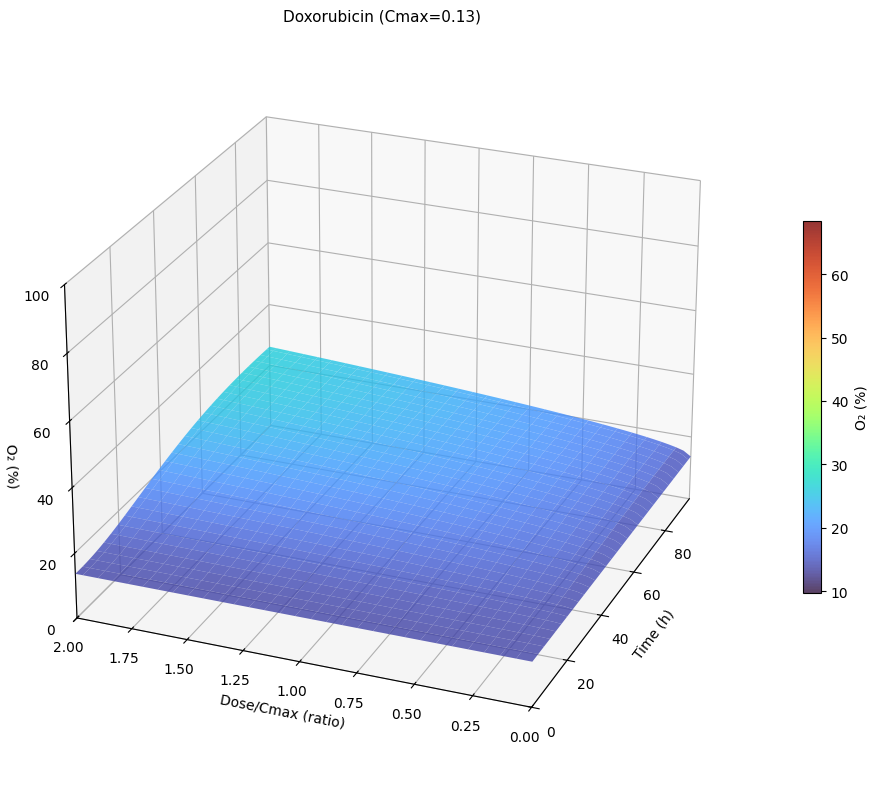

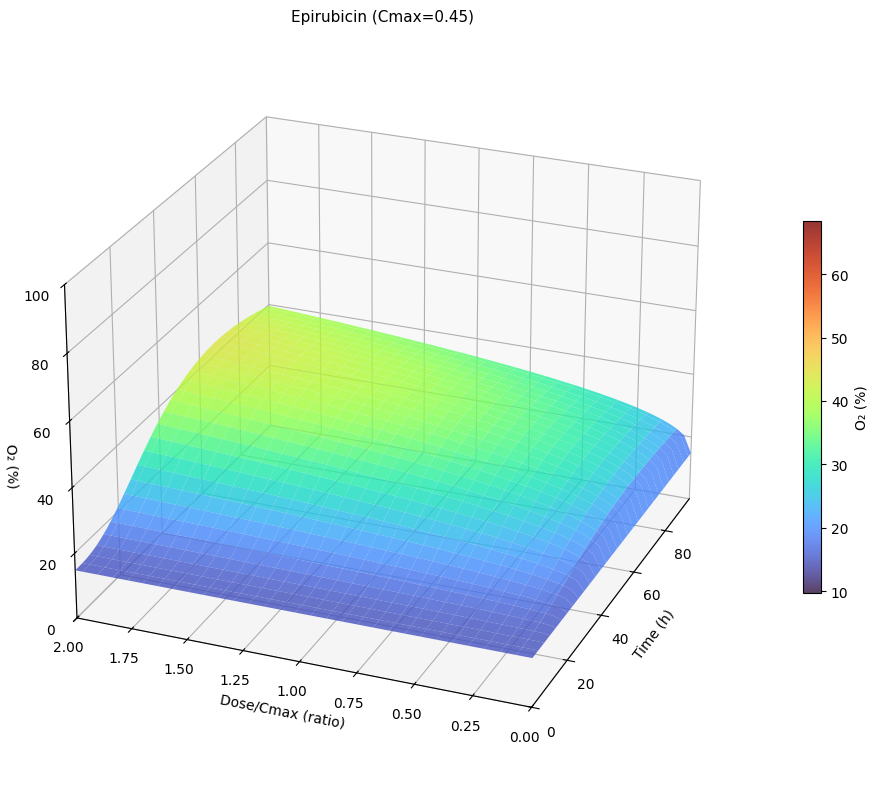

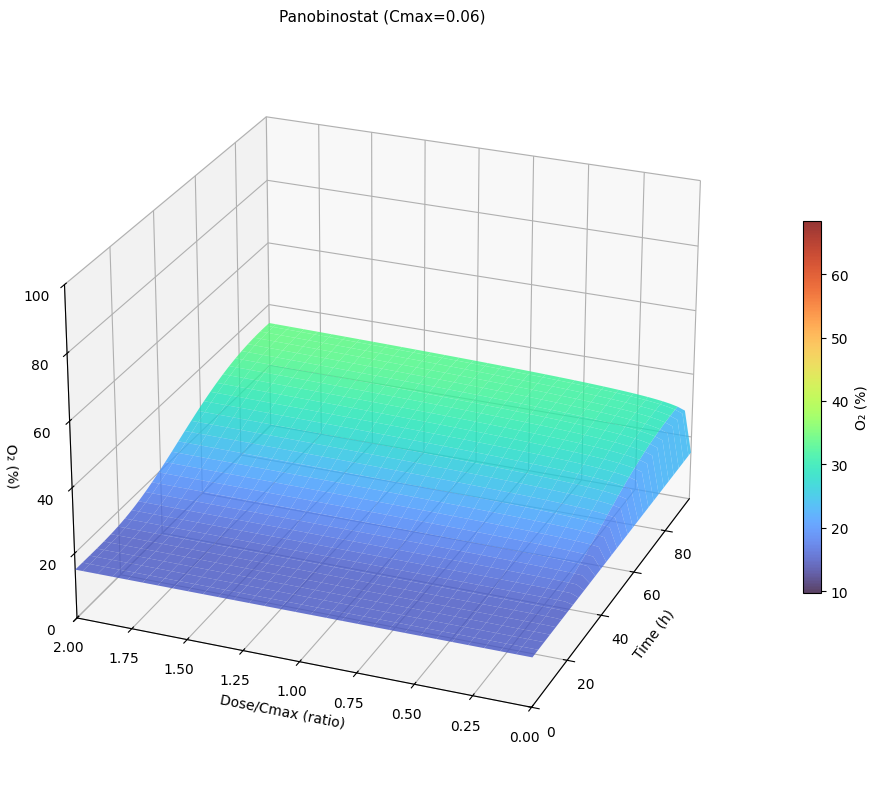

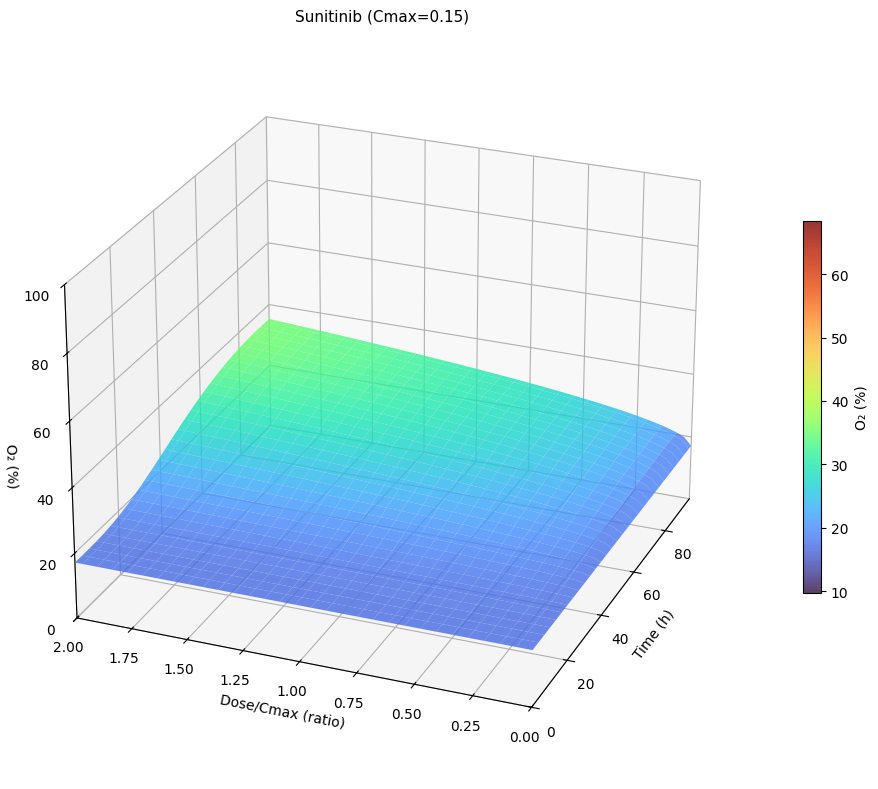

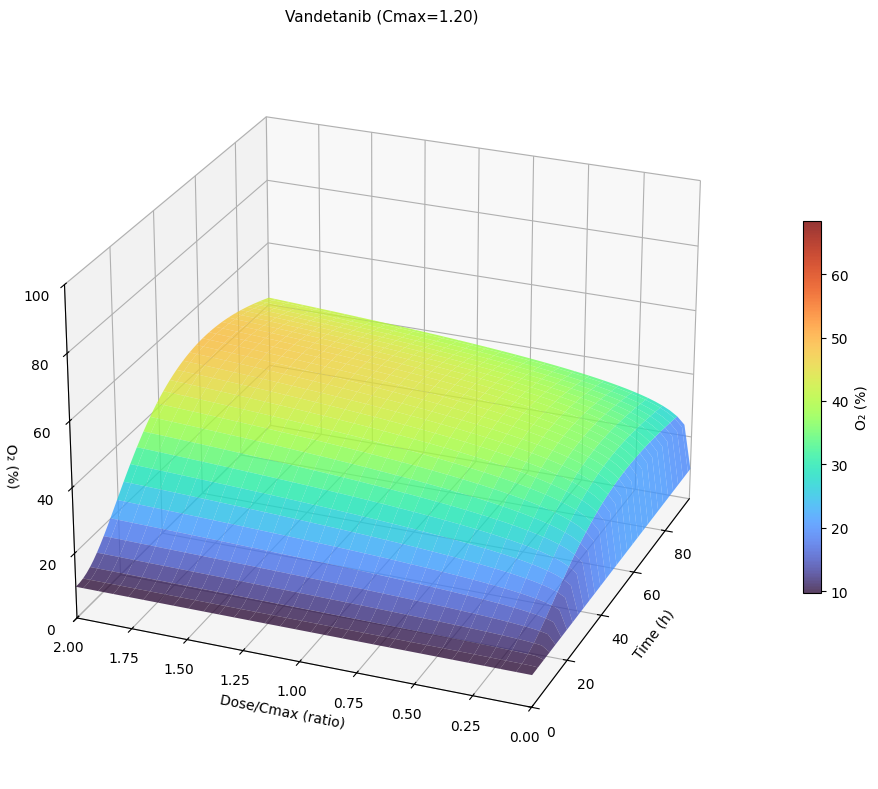

...

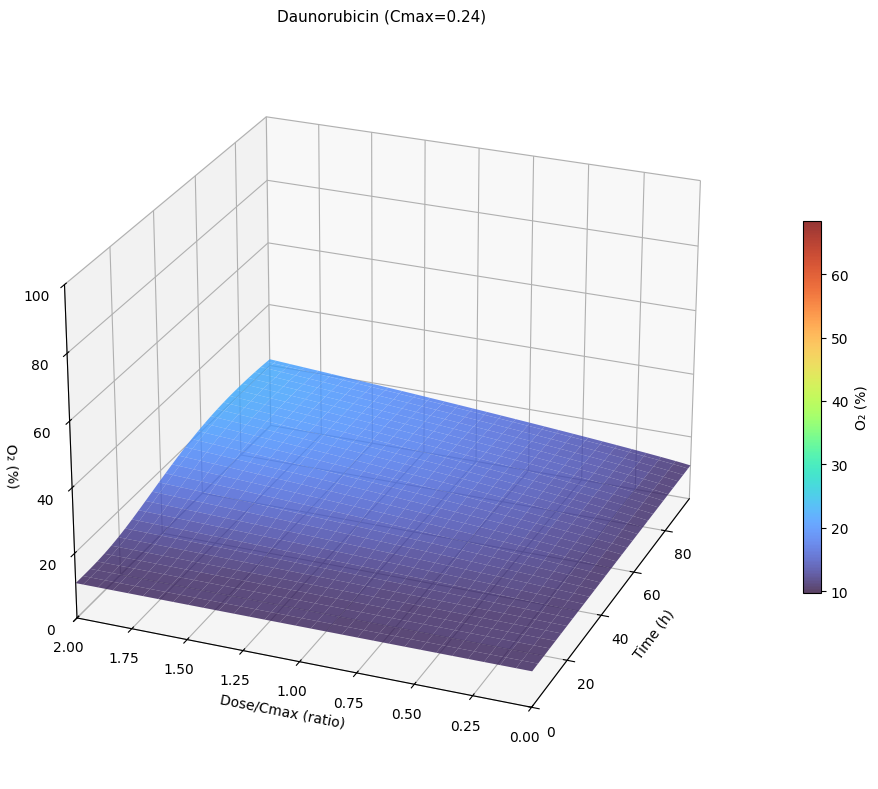

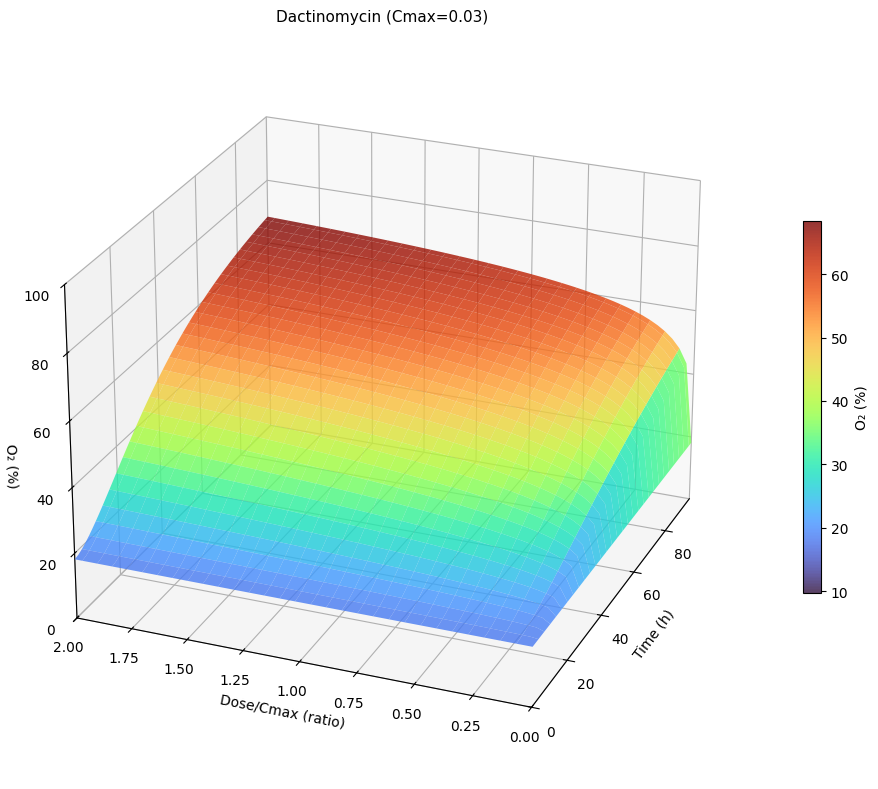

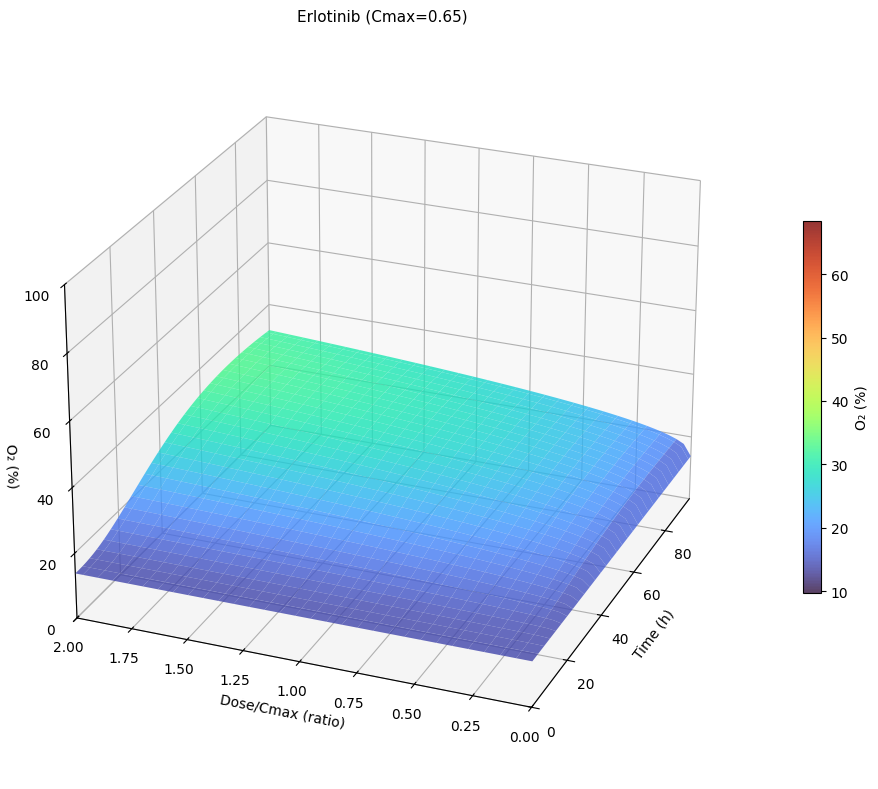

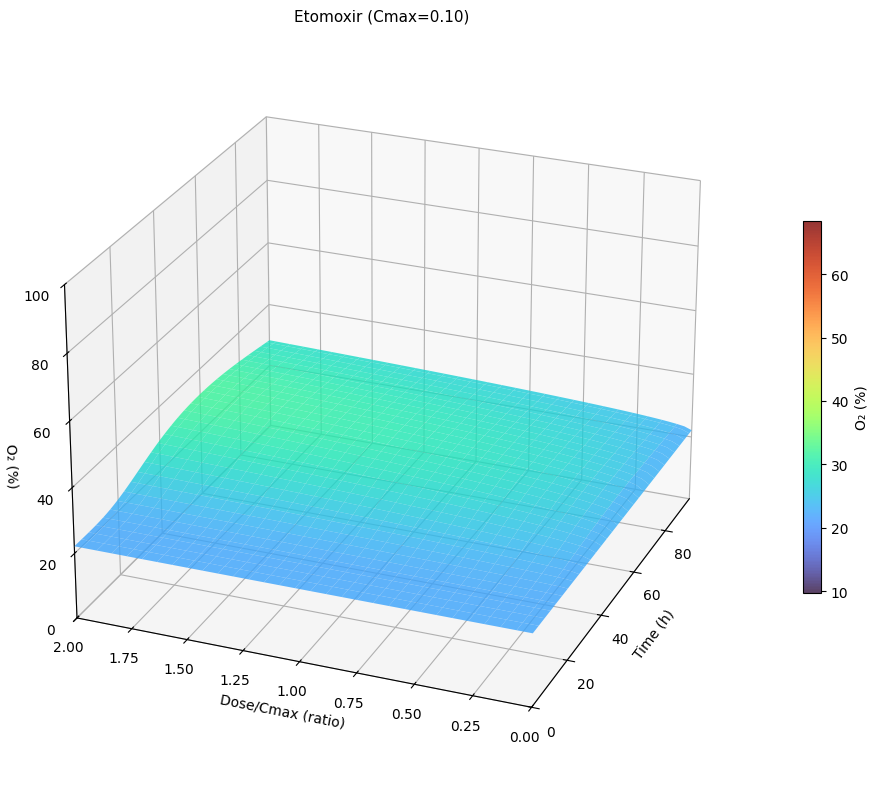

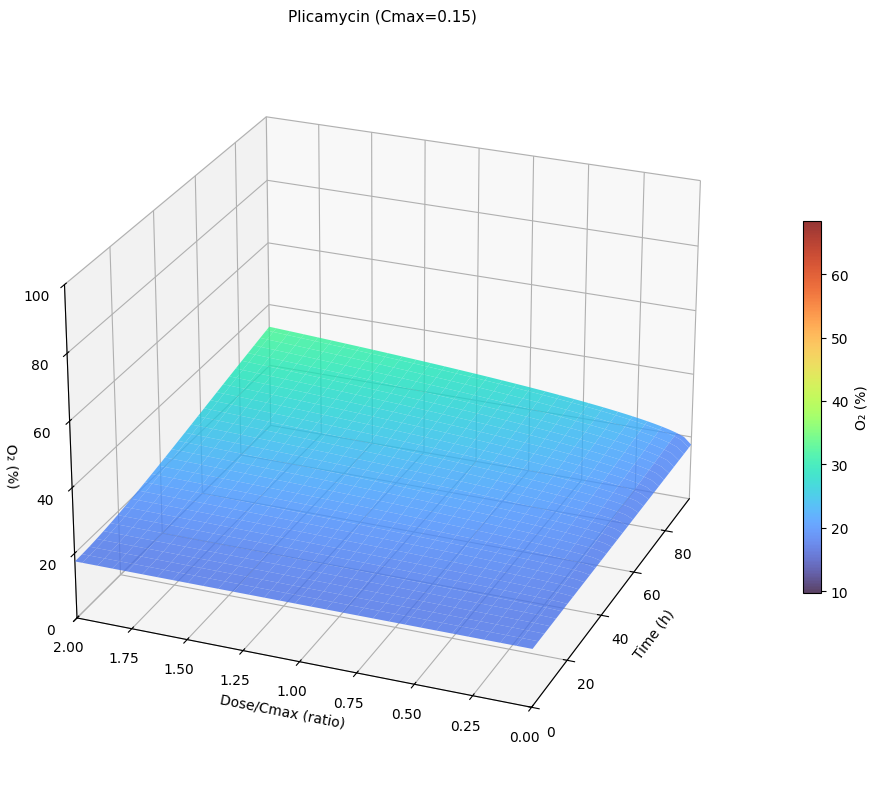

In [29]:
# Dependencies: Cell 1 (imports), Cell 3 (extract_coefficients), Cell 7 (pkpd_elimination_response), Cell 9 (plot_individual_surface), Cell 15 (filtering)
# Cell 9: Generate Individual Plots for O2
print("="*80)
print("GENERATING INDIVIDUAL O2 PLOTS (PAPER DRUGS ONLY)")
print("="*80)

for idx in df_o2_valid.index:
    drug_name = str(df_o2_valid.loc[idx, 'Drug'])
    
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    plot_individual_surface(df_o2_valid, idx, 'O2', ax=ax, vmin=o2_vmin, vmax=o2_vmax)
    
    # Add colorbar
    surf = ax.collections[0] if ax.collections else None
    if surf:
        fig.colorbar(surf, ax=ax, shrink=0.5, aspect=20, label='O₂ (%)')
    
    plt.tight_layout()
    
    # Store plot for saving later
    safe_name = f"{drug_name.replace(' ', '_').replace('/', '_')}_O2"
    safe_name = ''.join(c for c in safe_name if c.isalnum() or c in ('_', '-'))
    output_path = OUTPUT_DIR / f"{safe_name}.png"
    store_plot(fig, output_path)

print(f"\nGenerated {len(df_o2_valid)} individual O2 plots for paper drugs (stored for saving)")


In [30]:
# Dependencies: Cell 1 (imports), Cell 3 (extract_coefficients), Cell 7 (pkpd_elimination_response), Cell 9 (plot_individual_surface), Cell 15 (filtering)
# Cell 8: Generate Individual Plots for Contractility
print("="*80)
print("GENERATING INDIVIDUAL CONTRACTILITY PLOTS (PAPER DRUGS ONLY)")
print("="*80)


for idx in df_contractility_valid.index:
    drug_name = str(df_contractility_valid.loc[idx, 'Drug'])
    
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    plot_individual_surface(df_contractility_valid, idx, 'Contractility', ax=ax, vmin=contractility_vmin, vmax=contractility_vmax)
    
    # Add colorbar
    surf = ax.collections[0] if ax.collections else None
    if surf:
        fig.colorbar(surf, ax=ax, shrink=0.5, aspect=20, label='Contractility')
    
    plt.tight_layout()
    
    # Store plot for saving later
    safe_name = f"{drug_name.replace(' ', '_').replace('/', '_')}_Contractility"
    safe_name = ''.join(c for c in safe_name if c.isalnum() or c in ('_', '-'))
    output_path = OUTPUT_DIR / f"{safe_name}.png"
    store_plot(fig, output_path)
    
    # Close figure to free memory
    plt.close(fig)

print(f"\nGenerated {len(df_contractility_valid)} individual Contractility plots for paper drugs (stored for saving)")


GENERATING INDIVIDUAL CONTRACTILITY PLOTS (PAPER DRUGS ONLY)

Generated 11 individual Contractility plots for paper drugs (stored for saving)


## Simple 2D Plot: O2 Arrhythmia Cases vs Time

Simple 2D plot showing O2 response over time for all arrhythmia cases.


SIMPLE 2D PLOT: O2 ARRHYTHMIA CASES VS TIME

Plotting 5 O2 arrhythmia cases...

Data range: [9.6916, 48.7393]
Y-axis range: [7.7393, 50.6917]


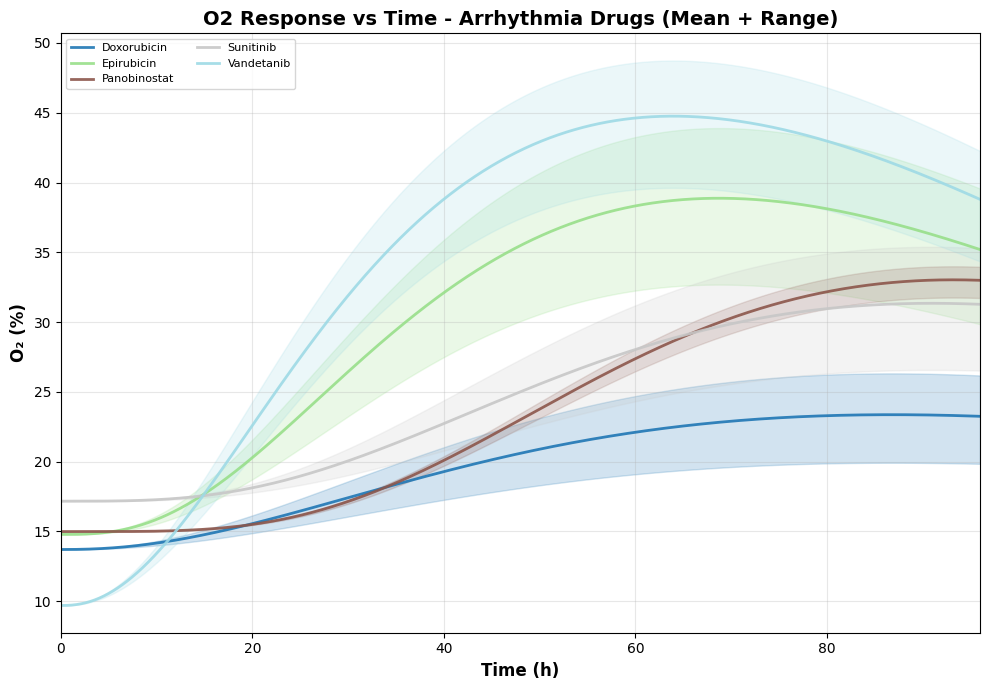


✓ Plotted 5 O2 arrhythmia cases

SIMPLE 2D PLOT: CONTRACTILITY ARRHYTHMIA DRUGS VS TIME

Plotting 5 Contractility arrhythmia cases...

Data range: [0.067023, 0.138178]
Y-axis range: [0.063465, 0.141736]


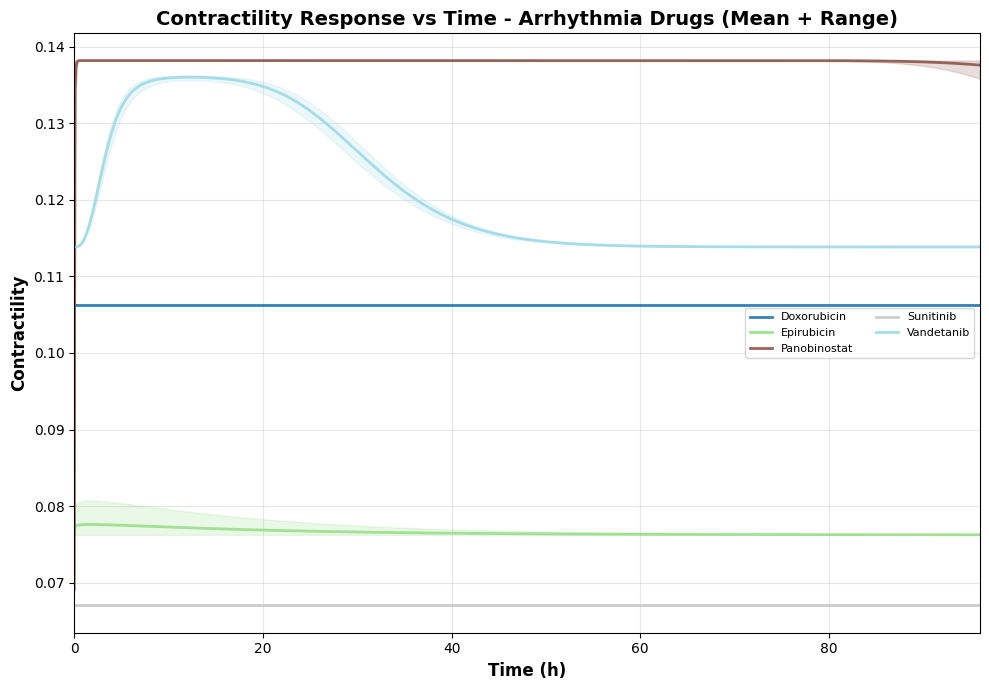


✓ Plotted 5 Contractility arrhythmia cases


In [31]:
# Dependencies: Cell 1 (imports), Cell 3 (extract_coefficients), Cell 7 (pkpd_elimination_response), Cell 15 (filter_valid_drugs, group_by_categories)
# Cell 20: Simple 2D Plot - O2 Arrhythmia Cases vs Time
print("="*80)
print("SIMPLE 2D PLOT: O2 ARRHYTHMIA CASES VS TIME")
print("="*80)

# Get arrhythmia True cases for O2 (group_by_categories converts boolean True to string 'True')
arrhythmia_true_indices = o2_groups.get('Arrhythmia', {}).get('True', [])

if len(arrhythmia_true_indices) > 0:
    print(f"\nPlotting {len(arrhythmia_true_indices)} O2 arrhythmia cases...")
    
    # Create figure
    fig, ax = plt.subplots(figsize=(10, 7))
    
    # Time range (X-axis - runs on right side from 0 to 96)
    # Increase resolution for smoother curves
    time = np.linspace(0, 96, 1000)
    
    # Colors for different drugs (one color per drug)
    drug_colors = plt.cm.tab20(np.linspace(0, 1, len(arrhythmia_true_indices)))
    
    # Concentrations to average over
    concentrations = [0.5, 1.0, 1.5, 2.0]
    
    # Collect all response data to determine y-axis range
    all_response_data = []
    
    # Plot each drug
    for i, drug_idx in enumerate(arrhythmia_true_indices):
        row = df_o2_valid.loc[drug_idx]  # Use .loc since drug_idx is the actual dataframe index, not positional
        drug_name = str(row['Drug'])
        
        R0 = row['R0']
        Emax = row['Emax']
        kappa = row['kappa']
        n = row['n']
        m = row['m']
        tau = row['tau']
        k_elim = row['k_elim']
        
        # Skip if invalid
        if not all(np.isfinite([R0, Emax, kappa, n, m, tau, k_elim])):
            continue
        
        # Calculate response for each concentration
        all_concentration_responses = []
        
        for j, conc in enumerate(concentrations):
            # For a constant concentration and varying time, calculate directly for each time point
            response = np.zeros_like(time)
            
            for k, t_val in enumerate(time):
                # Single values: dose_ratio = conc (constant), time = t_val (varying)
                dose_ratio_scalar = conc
                time_scalar = t_val
                
                # Calculate response for this specific (concentration, time) pair
                resp = pkpd_elimination_response(np.array([dose_ratio_scalar]), 
                                                np.array([time_scalar]), 
                                                R0, Emax, kappa, n, m, tau, k_elim)
                response[k] = np.asarray(resp).flatten()[0]
            
            # Clip to valid range
            response = np.clip(response, 0, 100)
            
            all_concentration_responses.append(response)
            all_response_data.append(response)
        
        # Calculate mean, min, and max across concentrations for each time point
        all_concentration_responses = np.array(all_concentration_responses)  # Shape: (4, len(time))
        response_mean = np.mean(all_concentration_responses, axis=0)
        response_min = np.min(all_concentration_responses, axis=0)
        response_max = np.max(all_concentration_responses, axis=0)
        
        # Plot mean curve for this drug (each drug gets its own color)
        ax.plot(time, response_mean, color=drug_colors[i], linewidth=2.0, alpha=0.9, label=drug_name)
        
        # Fill area between min and max with light hue (same color as line, lighter)
        ax.fill_between(time, response_min, response_max, color=drug_colors[i], alpha=0.2)
    
    # Calculate y-axis range from actual data
    if all_response_data:
        all_data = np.concatenate(all_response_data)
        y_min = np.nanmin(all_data)
        y_max = np.nanmax(all_data)
        
        # Add appropriate padding (5% of range on each side) to see the data clearly
        y_range = y_max - y_min
        if y_range > 0:
            y_padding = y_range * 0.05  # 5% padding on each side
        else:
            # If no variation, add small padding to see the value
            y_padding = 0.5
        
        y_min = y_min - y_padding
        y_max = y_max + y_padding
        
        # Ensure we stay within valid O2 range (0-100%)
        y_min = max(0, y_min)
        y_max = min(100, y_max)
        
        # Print data range for debugging
        print(f"\nData range: [{np.nanmin(all_data):.4f}, {np.nanmax(all_data):.4f}]")
        print(f"Y-axis range: [{y_min:.4f}, {y_max:.4f}]")
    else:
        y_min, y_max = 0, 100  # Default if no data
    
    # Set labels: Time on X-axis (right), O2 on Y-axis (left)
    ax.set_xlabel('Time (h)', fontsize=12, fontweight='bold')
    ax.set_ylabel('O₂ (%)', fontsize=12, fontweight='bold')
    ax.set_title('O2 Response vs Time - Arrhythmia Drugs (Mean + Range)', fontsize=14, fontweight='bold')
    
    # Set limits based on actual data range
    ax.set_xlim(0, 96)  # Time: 0 to 96 (X-axis, right side)
    ax.set_ylim(y_min, y_max)  # O2: fit to data range
    
    # Grid
    ax.grid(True, alpha=0.3)
    
    # Add legend for all drugs
    ax.legend(loc='best', fontsize=8, ncol=2)
    
    plt.tight_layout()
    plt.show()
    plt.close(fig)  # Close figure to free memory
    
    print(f"\n✓ Plotted {len(arrhythmia_true_indices)} O2 arrhythmia cases")
else:
    print("No arrhythmia True cases found for O2")

# Now plot Contractility for the same arrhythmia drugs
print("\n" + "="*80)
print("SIMPLE 2D PLOT: CONTRACTILITY ARRHYTHMIA DRUGS VS TIME")
print("="*80)

# Get arrhythmia True cases for Contractility
arrhythmia_true_indices_contractility = contractility_groups.get('Arrhythmia', {}).get('True', [])

if len(arrhythmia_true_indices_contractility) > 0:
    print(f"\nPlotting {len(arrhythmia_true_indices_contractility)} Contractility arrhythmia cases...")
    
    # Create figure
    fig, ax = plt.subplots(figsize=(10, 7))
    
    # Time range (X-axis - runs on right side from 0 to 96)
    # Increase resolution for smoother curves
    time = np.linspace(0, 96, 1000)
    
    # Colors for different drugs (one color per drug)
    drug_colors = plt.cm.tab20(np.linspace(0, 1, len(arrhythmia_true_indices_contractility)))
    
    # Concentrations to average over
    concentrations = [0.5, 1.0, 1.5, 2.0]
    
    # Collect all response data to determine y-axis range
    all_response_data = []
    
    # Plot each drug
    for i, drug_idx in enumerate(arrhythmia_true_indices_contractility):
        row = df_contractility_valid.loc[drug_idx]  # Use .loc since drug_idx is the actual dataframe index, not positional
        drug_name = str(row['Drug'])
        
        R0 = row['R0']
        Emax = row['Emax']
        kappa = row['kappa']
        n = row['n']
        m = row['m']
        tau = row['tau']
        k_elim = row['k_elim']
        
        # Skip if invalid
        if not all(np.isfinite([R0, Emax, kappa, n, m, tau, k_elim])):
            continue
        
        # Calculate response for each concentration
        all_concentration_responses = []
        
        for j, conc in enumerate(concentrations):
            # For a constant concentration and varying time, calculate directly for each time point
            response = np.zeros_like(time)
            
            for k, t_val in enumerate(time):
                # Single values: dose_ratio = conc (constant), time = t_val (varying)
                dose_ratio_scalar = conc
                time_scalar = t_val
                
                # Calculate response for this specific (concentration, time) pair
                resp = pkpd_elimination_response(np.array([dose_ratio_scalar]), 
                                                np.array([time_scalar]), 
                                                R0, Emax, kappa, n, m, tau, k_elim)
                response[k] = np.asarray(resp).flatten()[0]
            
            # Clip to valid range for contractility
            response = np.clip(response, 0, 0.2)
            
            all_concentration_responses.append(response)
            all_response_data.append(response)
        
        # Calculate mean, min, and max across concentrations for each time point
        all_concentration_responses = np.array(all_concentration_responses)  # Shape: (4, len(time))
        response_mean = np.mean(all_concentration_responses, axis=0)
        response_min = np.min(all_concentration_responses, axis=0)
        response_max = np.max(all_concentration_responses, axis=0)
        
        # Plot mean curve for this drug (each drug gets its own color)
        ax.plot(time, response_mean, color=drug_colors[i], linewidth=2.0, alpha=0.9, label=drug_name)
        
        # Fill area between min and max with light hue (same color as line, lighter)
        ax.fill_between(time, response_min, response_max, color=drug_colors[i], alpha=0.2)
    
    # Calculate y-axis range from actual data
    if all_response_data:
        all_data = np.concatenate(all_response_data)
        y_min = np.nanmin(all_data)
        y_max = np.nanmax(all_data)
        
        # Add appropriate padding (5% of range on each side) to see the data clearly
        y_range = y_max - y_min
        if y_range > 0:
            y_padding = y_range * 0.05  # 5% padding on each side
        else:
            # If no variation, add small padding to see the value
            y_padding = 0.01
        
        y_min = y_min - y_padding
        y_max = y_max + y_padding
        
        # Ensure we stay within valid Contractility range (0-0.2)
        y_min = max(0, y_min)
        y_max = min(0.2, y_max)
        
        # Print data range for debugging
        print(f"\nData range: [{np.nanmin(all_data):.6f}, {np.nanmax(all_data):.6f}]")
        print(f"Y-axis range: [{y_min:.6f}, {y_max:.6f}]")
    else:
        y_min, y_max = 0, 0.2  # Default if no data
    
    # Set labels: Time on X-axis (right), Contractility on Y-axis (left)
    ax.set_xlabel('Time (h)', fontsize=12, fontweight='bold')
    ax.set_ylabel('Contractility', fontsize=12, fontweight='bold')
    ax.set_title('Contractility Response vs Time - Arrhythmia Drugs (Mean + Range)', fontsize=14, fontweight='bold')
    
    # Set limits based on actual data range
    ax.set_xlim(0, 96)  # Time: 0 to 96 (X-axis, right side)
    ax.set_ylim(y_min, y_max)  # Contractility: fit to data range
    
    # Grid
    ax.grid(True, alpha=0.3)
    
    # Add legend for all drugs
    ax.legend(loc='best', fontsize=8, ncol=2)
    
    plt.tight_layout()
    plt.show()
    plt.close(fig)  # Close figure to free memory
    
    print(f"\n✓ Plotted {len(arrhythmia_true_indices_contractility)} Contractility arrhythmia cases")
else:
    print("No arrhythmia True cases found for Contractility")


## Simple 2D Plot: Cardiotoxicity Cases vs Time

Simple 2D plots showing O2 and Contractility response over time for all cardiotoxicity cases.


SIMPLE 2D PLOT: O2 CARDIOTOXICITY CASES VS TIME

Plotting 7 O2 cardiotoxicity cases...

Data range: [9.6916, 48.7393]
Y-axis range: [7.7393, 50.6917]


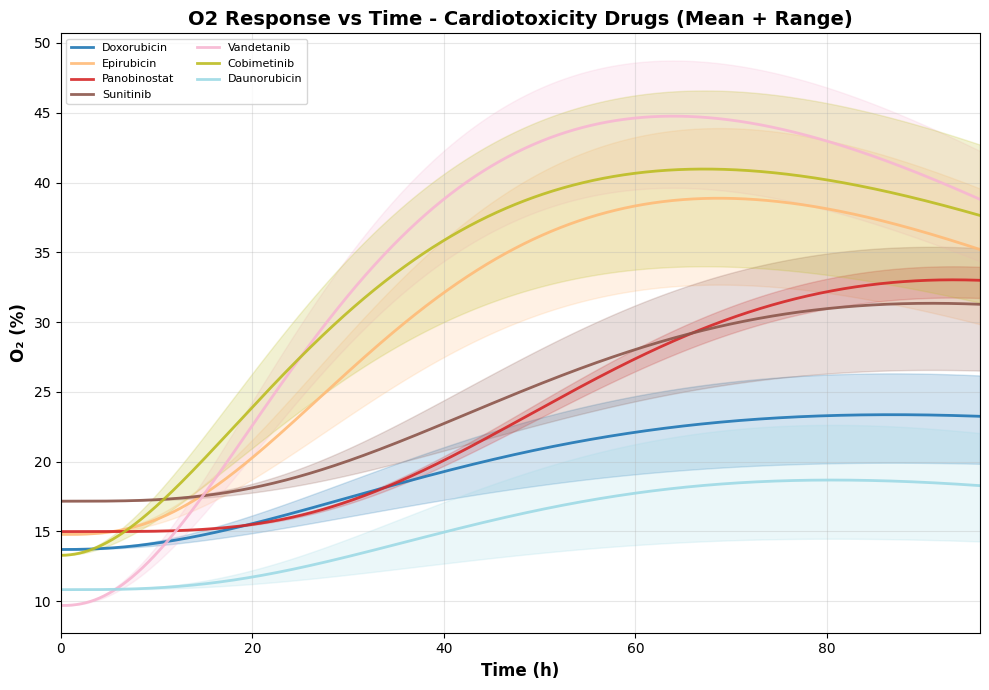


✓ Plotted 7 O2 cardiotoxicity cases

SIMPLE 2D PLOT: CONTRACTILITY CARDIOTOXICITY DRUGS VS TIME

Plotting 7 Contractility cardiotoxicity cases...

Data range: [0.058870, 0.138410]
Y-axis range: [0.054893, 0.142387]

✓ Plotted 7 Contractility cardiotoxicity cases


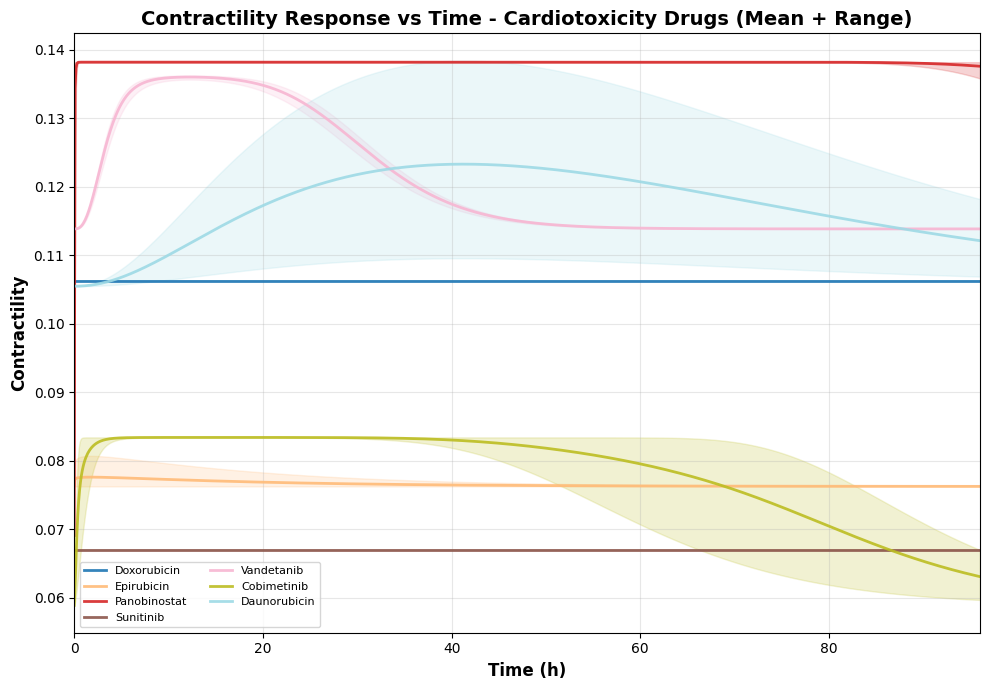

In [32]:
# Dependencies: Cell 1 (imports), Cell 3 (extract_coefficients), Cell 7 (pkpd_elimination_response), Cell 15 (filter_valid_drugs, group_by_categories)
# Cell 21: Simple 2D Plot - Cardiotoxicity Cases vs Time (O2 and Contractility)
print("="*80)
print("SIMPLE 2D PLOT: O2 CARDIOTOXICITY CASES VS TIME")
print("="*80)

# Get cardiotoxicity True cases for O2 (group_by_categories converts boolean True to string 'True')
cardiotoxicity_true_indices = o2_groups.get('Cardiotoxicity', {}).get('True', [])

if len(cardiotoxicity_true_indices) > 0:
    print(f"\nPlotting {len(cardiotoxicity_true_indices)} O2 cardiotoxicity cases...")
    
    # Create figure
    fig, ax = plt.subplots(figsize=(10, 7))
    
    # Time range (X-axis - runs on right side from 0 to 96)
    # Increase resolution for smoother curves
    time = np.linspace(0, 96, 1000)
    
    # Colors for different drugs (one color per drug)
    drug_colors = plt.cm.tab20(np.linspace(0, 1, len(cardiotoxicity_true_indices)))
    
    # Concentrations to average over
    concentrations = [0.5, 1.0, 1.5, 2.0]
    
    # Collect all response data to determine y-axis range
    all_response_data = []
    
    # Plot each drug
    for i, drug_idx in enumerate(cardiotoxicity_true_indices):
        row = df_o2_valid.loc[drug_idx]  # Use .loc since drug_idx is the actual dataframe index, not positional
        drug_name = str(row['Drug'])
        
        R0 = row['R0']
        Emax = row['Emax']
        kappa = row['kappa']
        n = row['n']
        m = row['m']
        tau = row['tau']
        k_elim = row['k_elim']
        
        # Skip if invalid
        if not all(np.isfinite([R0, Emax, kappa, n, m, tau, k_elim])):
            continue
        
        # Calculate response for each concentration
        all_concentration_responses = []
        
        for j, conc in enumerate(concentrations):
            # For a constant concentration and varying time, calculate directly for each time point
            response = np.zeros_like(time)
            
            for k, t_val in enumerate(time):
                # Single values: dose_ratio = conc (constant), time = t_val (varying)
                dose_ratio_scalar = conc
                time_scalar = t_val
                
                # Calculate response for this specific (concentration, time) pair
                resp = pkpd_elimination_response(np.array([dose_ratio_scalar]), 
                                                np.array([time_scalar]), 
                                                R0, Emax, kappa, n, m, tau, k_elim)
                response[k] = np.asarray(resp).flatten()[0]
            
            # Clip to valid range
            response = np.clip(response, 0, 100)
            
            all_concentration_responses.append(response)
            all_response_data.append(response)
        
        # Calculate mean, min, and max across concentrations for each time point
        all_concentration_responses = np.array(all_concentration_responses)  # Shape: (4, len(time))
        response_mean = np.mean(all_concentration_responses, axis=0)
        response_min = np.min(all_concentration_responses, axis=0)
        response_max = np.max(all_concentration_responses, axis=0)
        
        # Plot mean curve for this drug (each drug gets its own color)
        ax.plot(time, response_mean, color=drug_colors[i], linewidth=2.0, alpha=0.9, label=drug_name)
        
        # Fill area between min and max with light hue (same color as line, lighter)
        ax.fill_between(time, response_min, response_max, color=drug_colors[i], alpha=0.2)
    
    # Calculate y-axis range from actual data
    if all_response_data:
        all_data = np.concatenate(all_response_data)
        y_min = np.nanmin(all_data)
        y_max = np.nanmax(all_data)
        
        # Add appropriate padding (5% of range on each side) to see the data clearly
        y_range = y_max - y_min
        if y_range > 0:
            y_padding = y_range * 0.05  # 5% padding on each side
        else:
            # If no variation, add small padding to see the value
            y_padding = 0.5
        
        y_min = y_min - y_padding
        y_max = y_max + y_padding
        
        # Ensure we stay within valid O2 range (0-100%)
        y_min = max(0, y_min)
        y_max = min(100, y_max)
        
        # Print data range for debugging
        print(f"\nData range: [{np.nanmin(all_data):.4f}, {np.nanmax(all_data):.4f}]")
        print(f"Y-axis range: [{y_min:.4f}, {y_max:.4f}]")
    else:
        y_min, y_max = 0, 100  # Default if no data
    
    # Set labels: Time on X-axis (right), O2 on Y-axis (left)
    ax.set_xlabel('Time (h)', fontsize=12, fontweight='bold')
    ax.set_ylabel('O₂ (%)', fontsize=12, fontweight='bold')
    ax.set_title('O2 Response vs Time - Cardiotoxicity Drugs (Mean + Range)', fontsize=14, fontweight='bold')
    
    # Set limits based on actual data range
    ax.set_xlim(0, 96)  # Time: 0 to 96 (X-axis, right side)
    ax.set_ylim(y_min, y_max)  # O2: fit to data range
    
    # Grid
    ax.grid(True, alpha=0.3)
    
    # Add legend for all drugs
    ax.legend(loc='best', fontsize=8, ncol=2)
    
    plt.tight_layout()
    plt.show()
    plt.close(fig)  # Close figure to free memory
    
    print(f"\n✓ Plotted {len(cardiotoxicity_true_indices)} O2 cardiotoxicity cases")
else:
    print("No cardiotoxicity True cases found for O2")

# Now plot Contractility for the same cardiotoxicity drugs
print("\n" + "="*80)
print("SIMPLE 2D PLOT: CONTRACTILITY CARDIOTOXICITY DRUGS VS TIME")
print("="*80)

# Get cardiotoxicity True cases for Contractility
cardiotoxicity_true_indices_contractility = contractility_groups.get('Cardiotoxicity', {}).get('True', [])

if len(cardiotoxicity_true_indices_contractility) > 0:
    print(f"\nPlotting {len(cardiotoxicity_true_indices_contractility)} Contractility cardiotoxicity cases...")
    
    # Create figure
    fig, ax = plt.subplots(figsize=(10, 7))
    
    # Time range (X-axis - runs on right side from 0 to 96)
    # Increase resolution for smoother curves
    time = np.linspace(0, 96, 1000)
    
    # Colors for different drugs (one color per drug)
    drug_colors = plt.cm.tab20(np.linspace(0, 1, len(cardiotoxicity_true_indices_contractility)))
    
    # Concentrations to average over
    concentrations = [0.5, 1.0, 1.5, 2.0]
    
    # Collect all response data to determine y-axis range
    all_response_data = []
    
    # Plot each drug
    for i, drug_idx in enumerate(cardiotoxicity_true_indices_contractility):
        row = df_contractility_valid.loc[drug_idx]  # Use .loc since drug_idx is the actual dataframe index, not positional
        drug_name = str(row['Drug'])
        
        R0 = row['R0']
        Emax = row['Emax']
        kappa = row['kappa']
        n = row['n']
        m = row['m']
        tau = row['tau']
        k_elim = row['k_elim']
        
        # Skip if invalid
        if not all(np.isfinite([R0, Emax, kappa, n, m, tau, k_elim])):
            continue
        
        # Calculate response for each concentration
        all_concentration_responses = []
        
        for j, conc in enumerate(concentrations):
            # For a constant concentration and varying time, calculate directly for each time point
            response = np.zeros_like(time)
            
            for k, t_val in enumerate(time):
                # Single values: dose_ratio = conc (constant), time = t_val (varying)
                dose_ratio_scalar = conc
                time_scalar = t_val
                
                # Calculate response for this specific (concentration, time) pair
                resp = pkpd_elimination_response(np.array([dose_ratio_scalar]), 
                                                np.array([time_scalar]), 
                                                R0, Emax, kappa, n, m, tau, k_elim)
                response[k] = np.asarray(resp).flatten()[0]
            
            # Clip to valid range for contractility
            response = np.clip(response, 0, 0.2)
            
            all_concentration_responses.append(response)
            all_response_data.append(response)
        
        # Calculate mean, min, and max across concentrations for each time point
        all_concentration_responses = np.array(all_concentration_responses)  # Shape: (4, len(time))
        response_mean = np.mean(all_concentration_responses, axis=0)
        response_min = np.min(all_concentration_responses, axis=0)
        response_max = np.max(all_concentration_responses, axis=0)
        
        # Plot mean curve for this drug (each drug gets its own color)
        ax.plot(time, response_mean, color=drug_colors[i], linewidth=2.0, alpha=0.9, label=drug_name)
        
        # Fill area between min and max with light hue (same color as line, lighter)
        ax.fill_between(time, response_min, response_max, color=drug_colors[i], alpha=0.2)
    
    # Calculate y-axis range from actual data (after all drugs are processed)
    if all_response_data:
        all_data = np.concatenate(all_response_data)
        y_min = np.nanmin(all_data)
        y_max = np.nanmax(all_data)
        
        # Add appropriate padding (5% of range on each side) to see the data clearly
        y_range = y_max - y_min
        if y_range > 0:
            y_padding = y_range * 0.05  # 5% padding on each side
        else:
            # If no variation, add small padding to see the value
            y_padding = 0.01
        
        y_min = y_min - y_padding
        y_max = y_max + y_padding
        
        # Ensure we stay within valid Contractility range (0-0.2)
        y_min = max(0, y_min)
        y_max = min(0.2, y_max)
        
        # Print data range for debugging
        print(f"\nData range: [{np.nanmin(all_data):.6f}, {np.nanmax(all_data):.6f}]")
        print(f"Y-axis range: [{y_min:.6f}, {y_max:.6f}]")
    else:
        y_min, y_max = 0, 0.2  # Default if no data
    
    # Set labels: Time on X-axis (right), Contractility on Y-axis (left)
    ax.set_xlabel('Time (h)', fontsize=12, fontweight='bold')
    ax.set_ylabel('Contractility', fontsize=12, fontweight='bold')
    ax.set_title('Contractility Response vs Time - Cardiotoxicity Drugs (Mean + Range)', fontsize=14, fontweight='bold')
    
    # Set limits based on actual data range
    ax.set_xlim(0, 96)  # Time: 0 to 96 (X-axis, right side)
    ax.set_ylim(y_min, y_max)  # Contractility: fit to data range
    
    # Grid
    ax.grid(True, alpha=0.3)
    
    # Add legend for all drugs
    ax.legend(loc='best', fontsize=8, ncol=2)
    
    plt.tight_layout()
    #plt.show()
    
    print(f"\n✓ Plotted {len(cardiotoxicity_true_indices_contractility)} Contractility cardiotoxicity cases")
else:
    print("No cardiotoxicity True cases found for Contractility")


Plot each drug raw and curve fit 2d overlap 

INDIVIDUAL 2D PLOTS: O2 CARDIOTOXICITY DRUGS - MODEL + RAW DATA

Creating individual plots for 7 O2 cardiotoxicity drugs...

Processing drug 1/7: Doxorubicin
  ✓ Loaded raw data: 37 time points, 7 concentrations


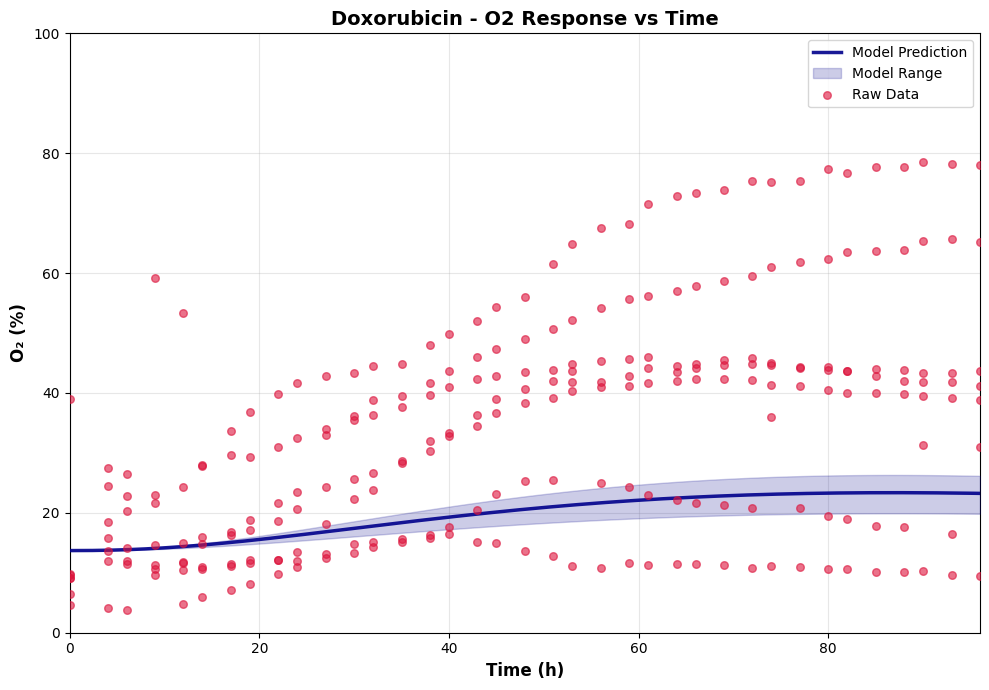


Processing drug 2/7: Epirubicin
  ✓ Loaded raw data: 37 time points, 8 concentrations


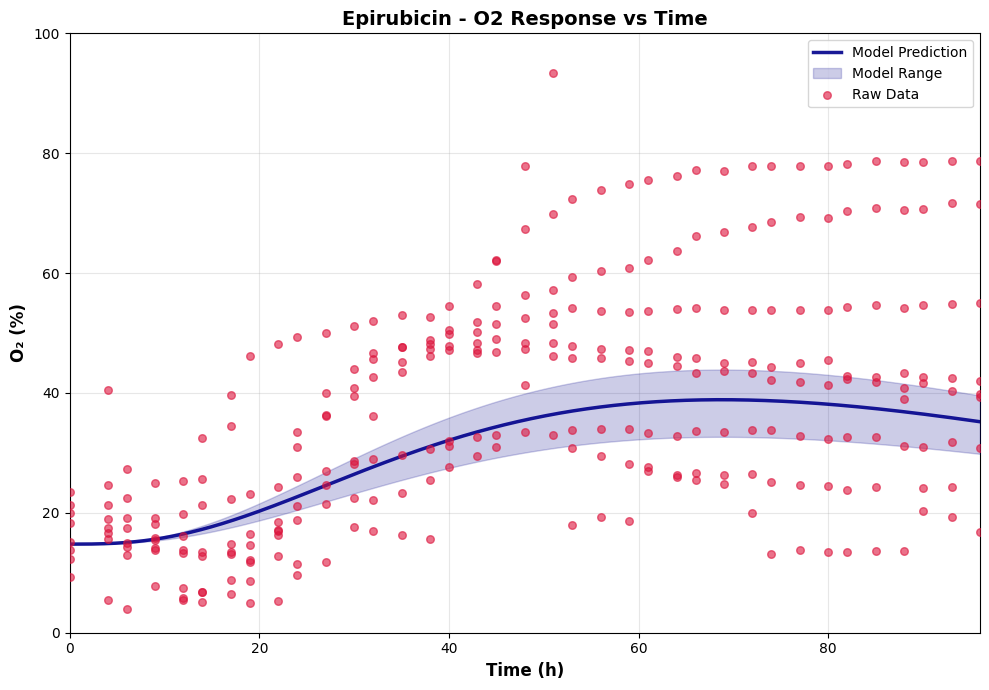


Processing drug 3/7: Panobinostat
  ✓ Loaded raw data: 37 time points, 7 concentrations


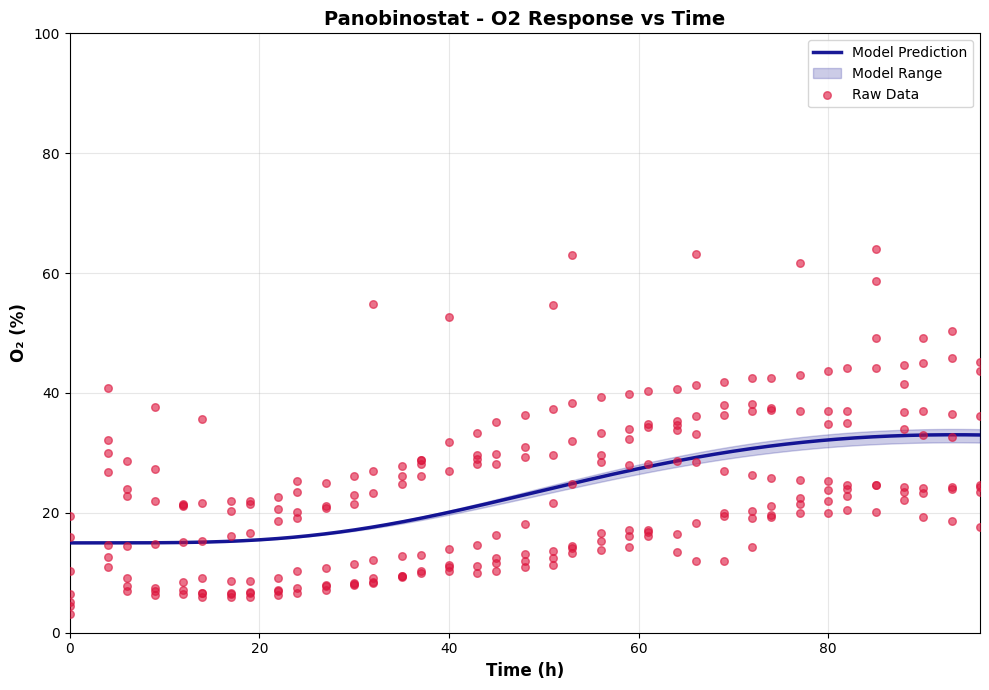


Processing drug 4/7: Sunitinib
  ✓ Loaded raw data: 37 time points, 8 concentrations


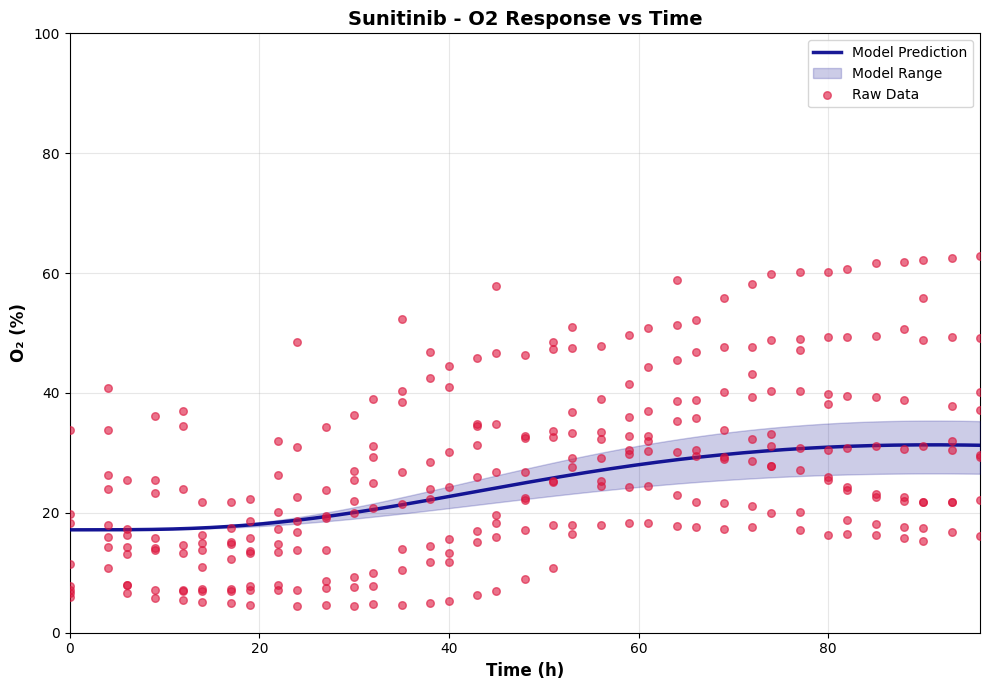


Processing drug 5/7: Vandetanib
  ✓ Loaded raw data: 37 time points, 8 concentrations


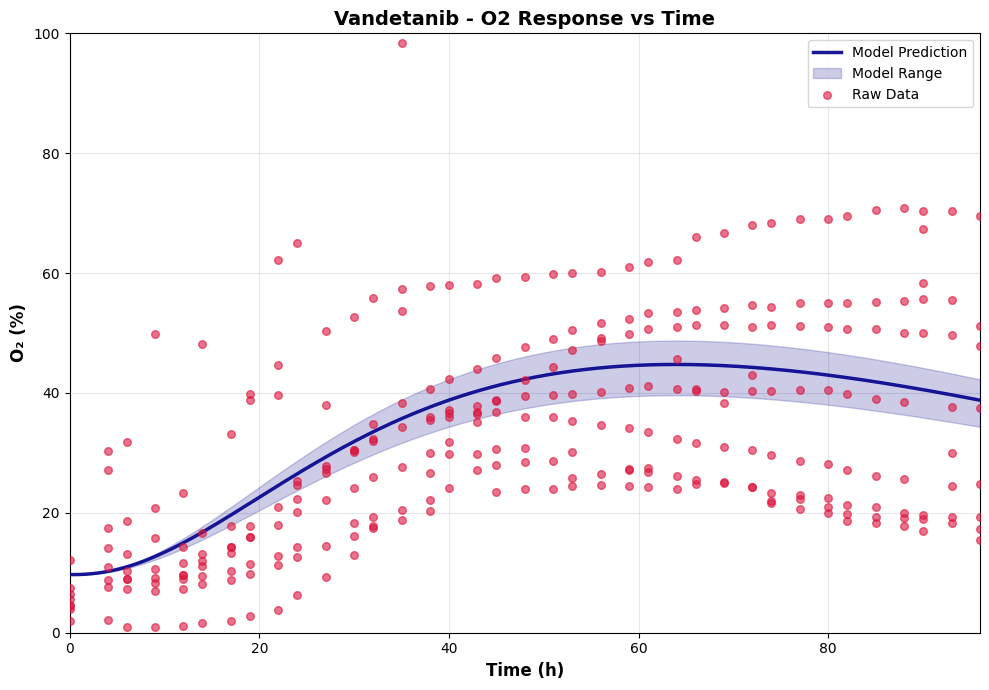


Processing drug 6/7: Cobimetinib
  ✓ Loaded raw data: 37 time points, 8 concentrations


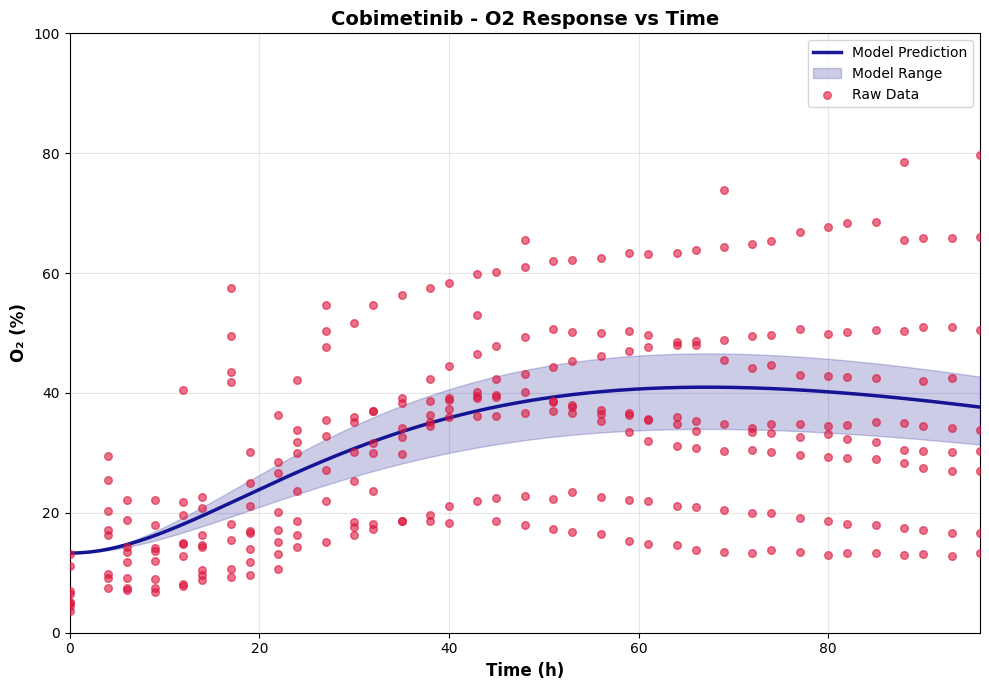


Processing drug 7/7: Daunorubicin
  ✓ Loaded raw data: 37 time points, 7 concentrations


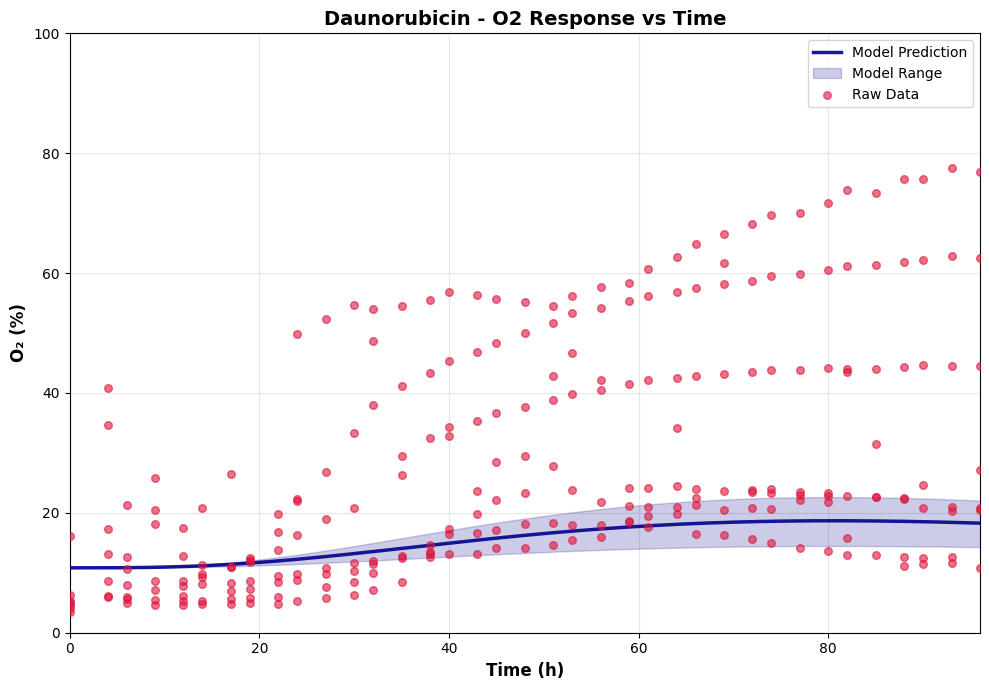


✓ Created 7 individual O2 plots

INDIVIDUAL 2D PLOTS: CONTRACTILITY CARDIOTOXICITY DRUGS - MODEL + RAW DATA

Creating individual plots for 7 Contractility cardiotoxicity drugs...

Processing drug 1/7: Doxorubicin
  ⚠ Error loading raw data for 'Doxorubicin': [Errno 2] No such file or directory: 'C:\\Users\\NoahB\\Documents\\HebrewU Bioengineering\\Cardiac_RODEO\\Cleaned_Data\\Contractility_Mean_Averaged.xlsx'


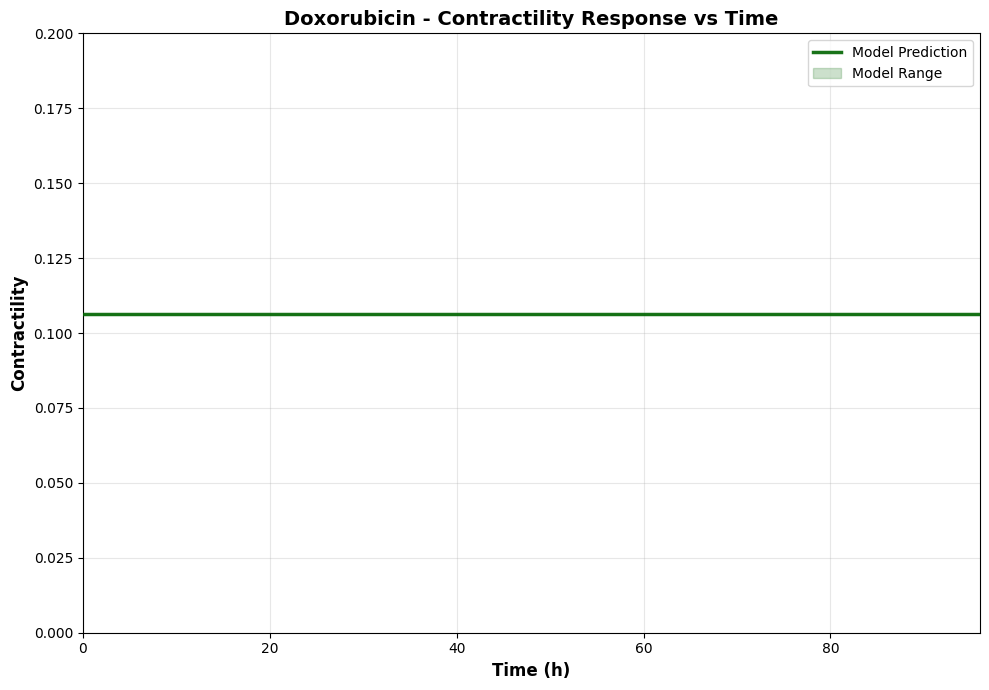


Processing drug 2/7: Epirubicin
  ⚠ Error loading raw data for 'Epirubicin': [Errno 2] No such file or directory: 'C:\\Users\\NoahB\\Documents\\HebrewU Bioengineering\\Cardiac_RODEO\\Cleaned_Data\\Contractility_Mean_Averaged.xlsx'


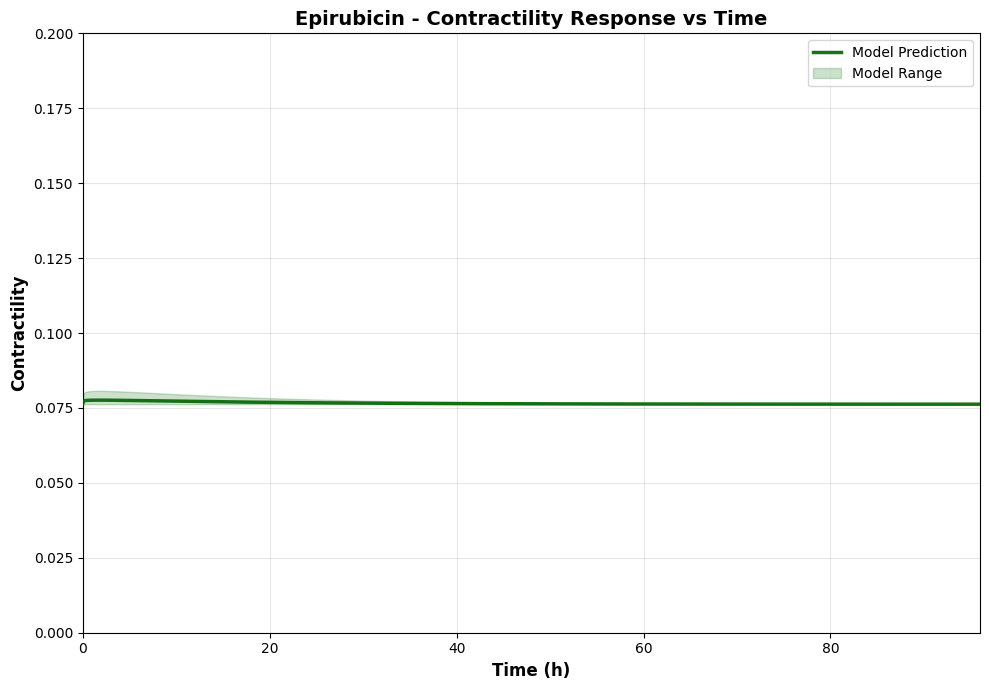


Processing drug 3/7: Panobinostat
  ⚠ Error loading raw data for 'Panobinostat': [Errno 2] No such file or directory: 'C:\\Users\\NoahB\\Documents\\HebrewU Bioengineering\\Cardiac_RODEO\\Cleaned_Data\\Contractility_Mean_Averaged.xlsx'


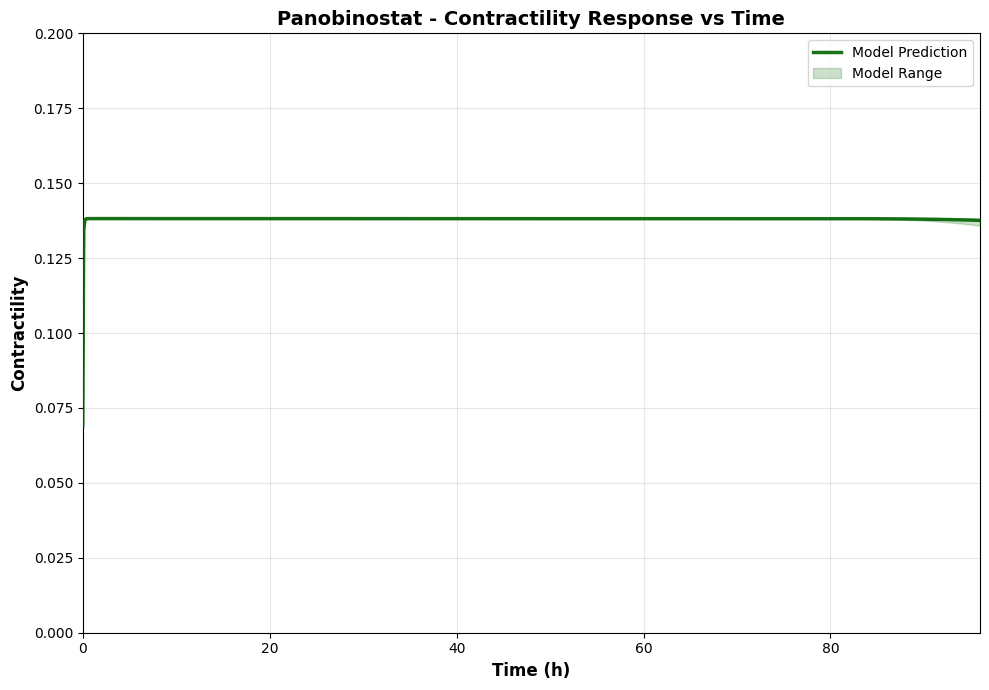


Processing drug 4/7: Sunitinib
  ⚠ Error loading raw data for 'Sunitinib': [Errno 2] No such file or directory: 'C:\\Users\\NoahB\\Documents\\HebrewU Bioengineering\\Cardiac_RODEO\\Cleaned_Data\\Contractility_Mean_Averaged.xlsx'


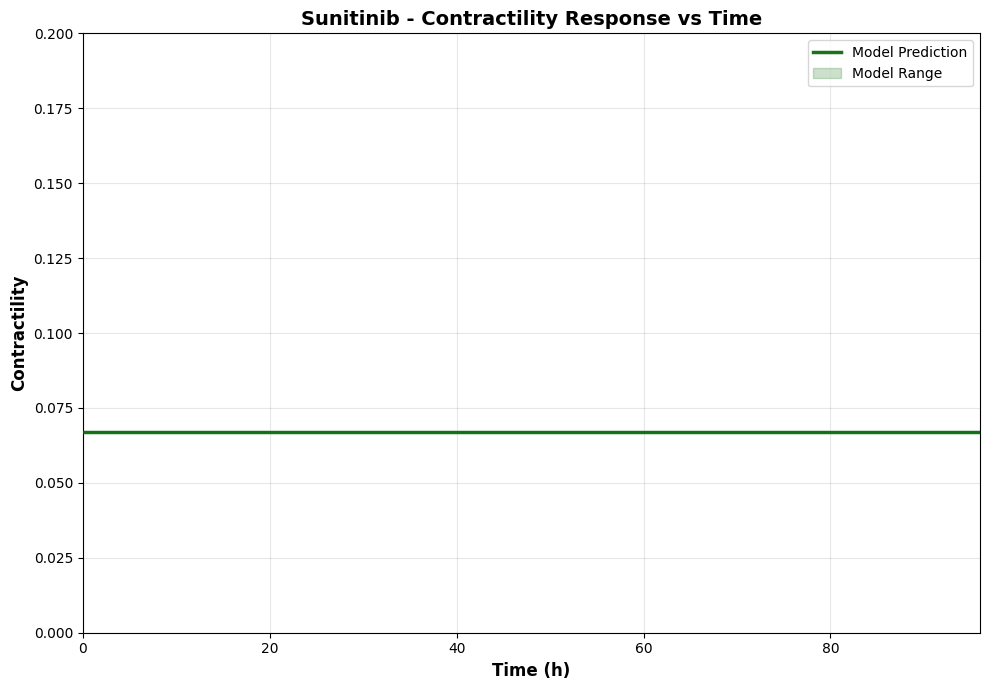


Processing drug 5/7: Vandetanib
  ⚠ Error loading raw data for 'Vandetanib': [Errno 2] No such file or directory: 'C:\\Users\\NoahB\\Documents\\HebrewU Bioengineering\\Cardiac_RODEO\\Cleaned_Data\\Contractility_Mean_Averaged.xlsx'


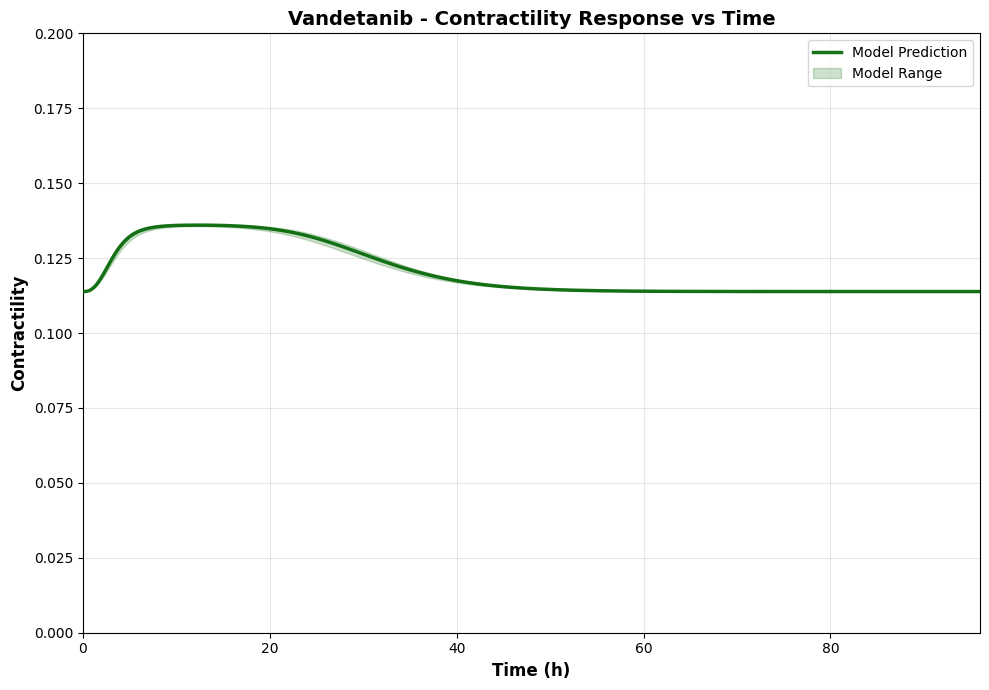


Processing drug 6/7: Cobimetinib
  ⚠ Error loading raw data for 'Cobimetinib': [Errno 2] No such file or directory: 'C:\\Users\\NoahB\\Documents\\HebrewU Bioengineering\\Cardiac_RODEO\\Cleaned_Data\\Contractility_Mean_Averaged.xlsx'


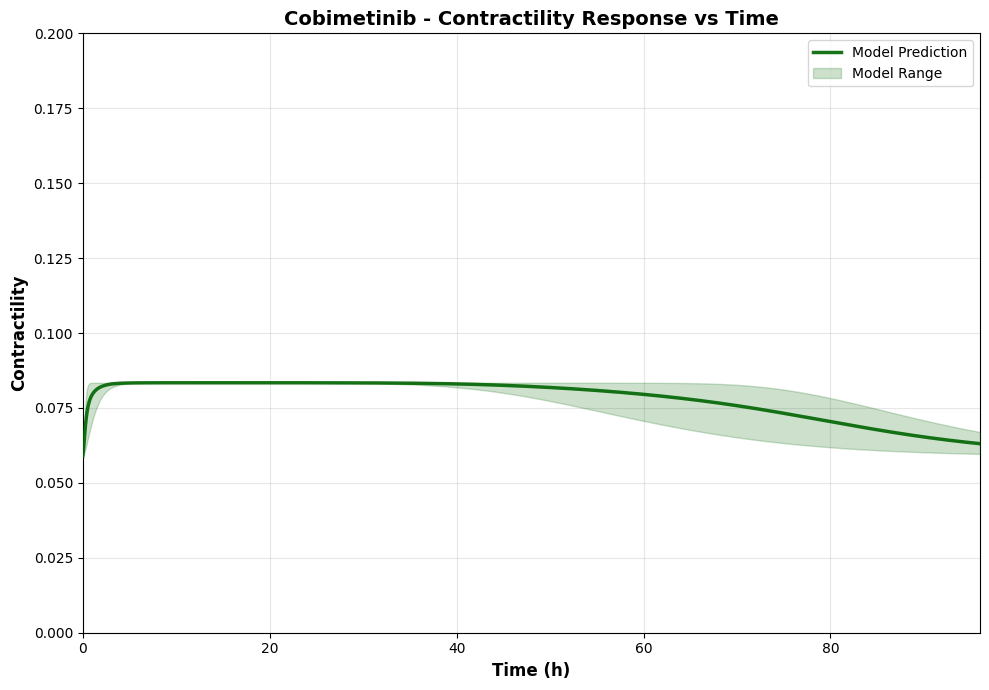


Processing drug 7/7: Daunorubicin
  ⚠ Error loading raw data for 'Daunorubicin': [Errno 2] No such file or directory: 'C:\\Users\\NoahB\\Documents\\HebrewU Bioengineering\\Cardiac_RODEO\\Cleaned_Data\\Contractility_Mean_Averaged.xlsx'


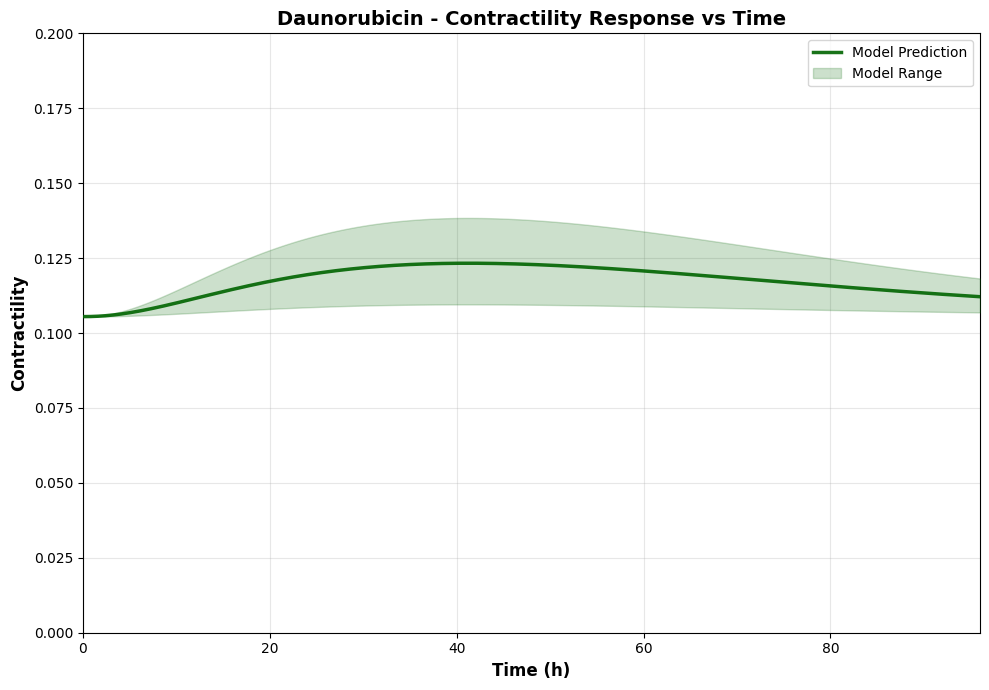


✓ Created 7 individual Contractility plots


In [36]:
# Dependencies: Cell 1 (imports), Cell 3 (extract_coefficients), Cell 7 (pkpd_elimination_response), Cell 15 (filter_valid_drugs, group_by_categories)
# Cell 21: Individual 2D Plots - Each Cardiotoxicity Drug with Model Prediction + Raw Data Overlay
print("="*80)
print("INDIVIDUAL 2D PLOTS: O2 CARDIOTOXICITY DRUGS - MODEL + RAW DATA")
print("="*80)

# Path to raw O2 data Excel file
o2_xlsx_path = r"C:\Users\NoahB\Documents\HebrewU Bioengineering\Cardiac_RODEO\Cleaned_Data\O2_Mean_Averaged.xlsx"

# Get cardiotoxicity True cases for O2
cardiotoxicity_true_indices = o2_groups.get('Cardiotoxicity', {}).get('True', [])

if len(cardiotoxicity_true_indices) > 0:
    print(f"\nCreating individual plots for {len(cardiotoxicity_true_indices)} O2 cardiotoxicity drugs...")
    
    # Time range for model predictions (smooth curve)
    time = np.linspace(0, 96, 1000)
    
    # Concentrations to average over
    concentrations = [0.5, 1.0, 1.5, 2.0]
    
    # Plot each drug individually
    for i, drug_idx in enumerate(cardiotoxicity_true_indices):
        row = df_o2_valid.loc[drug_idx]
        drug_name = str(row['Drug'])
        
        print(f"\nProcessing drug {i+1}/{len(cardiotoxicity_true_indices)}: {drug_name}")
        
        # Extract model parameters
        R0 = row['R0']
        Emax = row['Emax']
        kappa = row['kappa']
        n = row['n']
        m = row['m']
        tau = row['tau']
        k_elim = row['k_elim']
        
        # Skip if invalid parameters
        if not all(np.isfinite([R0, Emax, kappa, n, m, tau, k_elim])):
            print(f"  ⚠ Skipping {drug_name} - invalid parameters")
            continue
        
        # Create individual figure for this drug
        fig, ax = plt.subplots(figsize=(10, 7))
        
        # Calculate model response for each concentration
        all_concentration_responses = []
        
        for j, conc in enumerate(concentrations):
            response = np.zeros_like(time)
            
            for k, t_val in enumerate(time):
                resp = pkpd_elimination_response(np.array([conc]), 
                                                np.array([t_val]), 
                                                R0, Emax, kappa, n, m, tau, k_elim)
                response[k] = np.asarray(resp).flatten()[0]
            
            # Clip to valid O2 range
            response = np.clip(response, 0, 100)
            all_concentration_responses.append(response)
        
        # Calculate mean, min, and max across concentrations
        all_concentration_responses = np.array(all_concentration_responses)
        response_mean = np.mean(all_concentration_responses, axis=0)
        response_min = np.min(all_concentration_responses, axis=0)
        response_max = np.max(all_concentration_responses, axis=0)
        
        # Plot model prediction: mean curve and shaded range
        model_color = 'darkblue'
        ax.plot(time, response_mean, color=model_color, linewidth=2.5, alpha=0.9, label='Model Prediction', zorder=5)
        ax.fill_between(time, response_min, response_max, color=model_color, alpha=0.2, label='Model Range', zorder=4)
        
        # Load and plot raw O2 data from Excel
        try:
            o2_sheet_df = pd.read_excel(o2_xlsx_path, sheet_name=drug_name)
            
            # First column is time, remaining columns are O2 values for different concentrations
            o2_time = o2_sheet_df.iloc[:, 0].values
            o2_values = o2_sheet_df.iloc[:, 1:].values  # Shape: (n_times, n_concentrations)
            
            # Plot each concentration's raw data as scatter points
            raw_color = 'crimson'
            for conc_idx in range(o2_values.shape[1]):
                ax.scatter(
                    o2_time, 
                    o2_values[:, conc_idx], 
                    color=raw_color, 
                    alpha=0.6, 
                    label='Raw Data' if conc_idx == 0 else None, 
                    s=30,
                    zorder=10
                )
            
            print(f"  ✓ Loaded raw data: {len(o2_time)} time points, {o2_values.shape[1]} concentrations")
            
        except ValueError:
            print(f"  ⚠ No Excel sheet found for drug '{drug_name}'")
        except Exception as e:
            print(f"  ⚠ Error loading raw data for '{drug_name}': {e}")
        
        # Set axis labels and title
        ax.set_xlabel('Time (h)', fontsize=12, fontweight='bold')
        ax.set_ylabel('O₂ (%)', fontsize=12, fontweight='bold')
        ax.set_title(f'{drug_name} - O2 Response vs Time', fontsize=14, fontweight='bold')
        
        # Set axis limits
        ax.set_xlim(0, 96)
        ax.set_ylim(0, 100)
        
        # Grid and legend
        ax.grid(True, alpha=0.3)
        ax.legend(loc='best', fontsize=10)
        
        plt.tight_layout()
        plt.show()
        plt.close(fig)
    
    print(f"\n✓ Created {len(cardiotoxicity_true_indices)} individual O2 plots")
else:
    print("No cardiotoxicity True cases found for O2")


# Now do the same for Contractility
print("\n" + "="*80)
print("INDIVIDUAL 2D PLOTS: CONTRACTILITY CARDIOTOXICITY DRUGS - MODEL + RAW DATA")
print("="*80)

# Path to raw Contractility data Excel file
contractility_xlsx_path = r"C:\Users\NoahB\Documents\HebrewU Bioengineering\Cardiac_RODEO\Cleaned_Data\Contractility_Mean_Averaged.xlsx"

# Get cardiotoxicity True cases for Contractility
cardiotoxicity_true_indices_contractility = contractility_groups.get('Cardiotoxicity', {}).get('True', [])

if len(cardiotoxicity_true_indices_contractility) > 0:
    print(f"\nCreating individual plots for {len(cardiotoxicity_true_indices_contractility)} Contractility cardiotoxicity drugs...")
    
    # Time range for model predictions
    time = np.linspace(0, 96, 1000)
    
    # Concentrations to average over
    concentrations = [0.5, 1.0, 1.5, 2.0]
    
    # Plot each drug individually
    for i, drug_idx in enumerate(cardiotoxicity_true_indices_contractility):
        row = df_contractility_valid.loc[drug_idx]
        drug_name = str(row['Drug'])
        
        print(f"\nProcessing drug {i+1}/{len(cardiotoxicity_true_indices_contractility)}: {drug_name}")
        
        # Extract model parameters
        R0 = row['R0']
        Emax = row['Emax']
        kappa = row['kappa']
        n = row['n']
        m = row['m']
        tau = row['tau']
        k_elim = row['k_elim']
        
        # Skip if invalid parameters
        if not all(np.isfinite([R0, Emax, kappa, n, m, tau, k_elim])):
            print(f"  ⚠ Skipping {drug_name} - invalid parameters")
            continue
        
        # Create individual figure for this drug
        fig, ax = plt.subplots(figsize=(10, 7))
        
        # Calculate model response for each concentration
        all_concentration_responses = []
        
        for j, conc in enumerate(concentrations):
            response = np.zeros_like(time)
            
            for k, t_val in enumerate(time):
                resp = pkpd_elimination_response(np.array([conc]), 
                                                np.array([t_val]), 
                                                R0, Emax, kappa, n, m, tau, k_elim)
                response[k] = np.asarray(resp).flatten()[0]
            
            # Clip to valid Contractility range
            response = np.clip(response, 0, 0.2)
            all_concentration_responses.append(response)
        
        # Calculate mean, min, and max across concentrations
        all_concentration_responses = np.array(all_concentration_responses)
        response_mean = np.mean(all_concentration_responses, axis=0)
        response_min = np.min(all_concentration_responses, axis=0)
        response_max = np.max(all_concentration_responses, axis=0)
        
        # Plot model prediction: mean curve and shaded range
        model_color = 'darkgreen'
        ax.plot(time, response_mean, color=model_color, linewidth=2.5, alpha=0.9, label='Model Prediction', zorder=5)
        ax.fill_between(time, response_min, response_max, color=model_color, alpha=0.2, label='Model Range', zorder=4)
        
        # Load and plot raw Contractility data from Excel
        try:
            contractility_sheet_df = pd.read_excel(contractility_xlsx_path, sheet_name=drug_name)
            
            # First column is time, remaining columns are Contractility values for different concentrations
            contractility_time = contractility_sheet_df.iloc[:, 0].values
            contractility_values = contractility_sheet_df.iloc[:, 1:].values
            
            # Plot each concentration's raw data as scatter points
            raw_color = 'darkorange'
            for conc_idx in range(contractility_values.shape[1]):
                ax.scatter(
                    contractility_time, 
                    contractility_values[:, conc_idx], 
                    color=raw_color, 
                    alpha=0.6, 
                    label='Raw Data' if conc_idx == 0 else None, 
                    s=30,
                    zorder=10
                )
            
            print(f"  ✓ Loaded raw data: {len(contractility_time)} time points, {contractility_values.shape[1]} concentrations")
            
        except ValueError:
            print(f"  ⚠ No Excel sheet found for drug '{drug_name}'")
        except Exception as e:
            print(f"  ⚠ Error loading raw data for '{drug_name}': {e}")
        
        # Set axis labels and title
        ax.set_xlabel('Time (h)', fontsize=12, fontweight='bold')
        ax.set_ylabel('Contractility', fontsize=12, fontweight='bold')
        ax.set_title(f'{drug_name} - Contractility Response vs Time', fontsize=14, fontweight='bold')
        
        # Set axis limits
        ax.set_xlim(0, 96)
        ax.set_ylim(0, 0.2)
        
        # Grid and legend
        ax.grid(True, alpha=0.3)
        ax.legend(loc='best', fontsize=10)
        
        plt.tight_layout()
        plt.show()
        plt.close(fig)
    
    print(f"\n✓ Created {len(cardiotoxicity_true_indices_contractility)} individual Contractility plots")
else:
    print("No cardiotoxicity True cases found for Contractility")


### Preview: Overlay Contractility Plots

Preview sample overlay plots for Contractility before saving all.


PREVIEW: SAMPLE OVERLAY CONTRACTILITY PLOTS


NameError: name 'plot_overlay_surfaces' is not defined

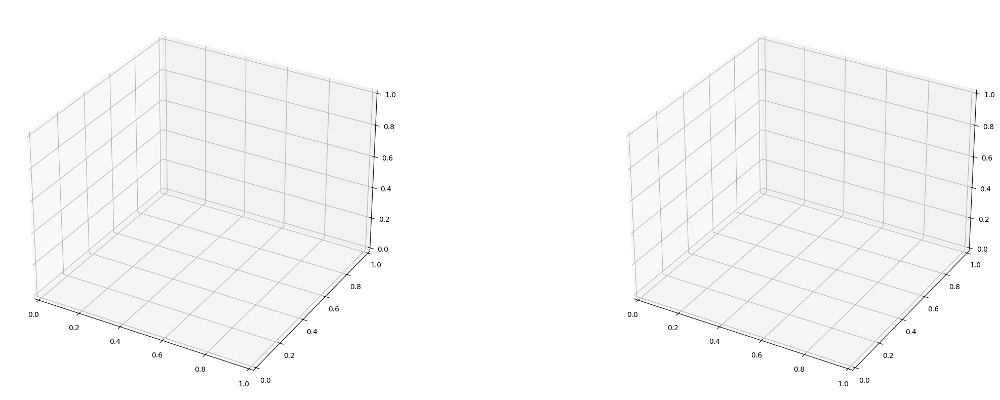

In [16]:
# Preview: Sample Overlay Contractility Plots
print("="*80)
print("PREVIEW: SAMPLE OVERLAY CONTRACTILITY PLOTS")
print("="*80)

# Find categories with multiple drugs for preview
preview_categories = []
for cat_type, cat_dict in contractility_groups.items():
    for cat_val, indices in cat_dict.items():
        if len(indices) >= 2:
            preview_categories.append((cat_type, cat_val, indices))
            if len(preview_categories) >= 2:  # Show 2 previews
                break
    if len(preview_categories) >= 2:
        break

if preview_categories:
    num_preview = len(preview_categories)
    fig, axes = plt.subplots(1, num_preview, figsize=(14*num_preview, 10), 
                             subplot_kw={'projection': '3d'})
    
    if num_preview == 1:
        axes = [axes]
    
    for i, (cat_type, cat_val, drug_indices) in enumerate(preview_categories):
        plot_overlay_surfaces(df_contractility_valid, drug_indices, 'Contractility',
                             f'{cat_type}: {cat_val}', ax=axes[i], vmin=contractility_vmin, vmax=contractility_vmax)
        axes[i].set_title(f'{cat_type}: {cat_val}\n(Contractility Overlay)', 
                         fontsize=11, fontweight='bold', pad=15)
    
    plt.tight_layout()
    plt.show()
    
    print(f"\nPreview complete. Will save overlay plots for all Contractility categories next.")
    print(f"Total categories to save: {sum(len(indices) for cat_dict in contractility_groups.values() for indices in cat_dict.values() if len(indices) > 0)}")
else:
    print("No categories with multiple drugs found for preview")


## Step 7: Generate Overlay Plots by Category

Create overlay plots showing all drugs in each category on one plot.


GENERATING OVERLAY PLOTS FOR CONTRACTILITY

Contractility overlay plots generated (stored for saving)!


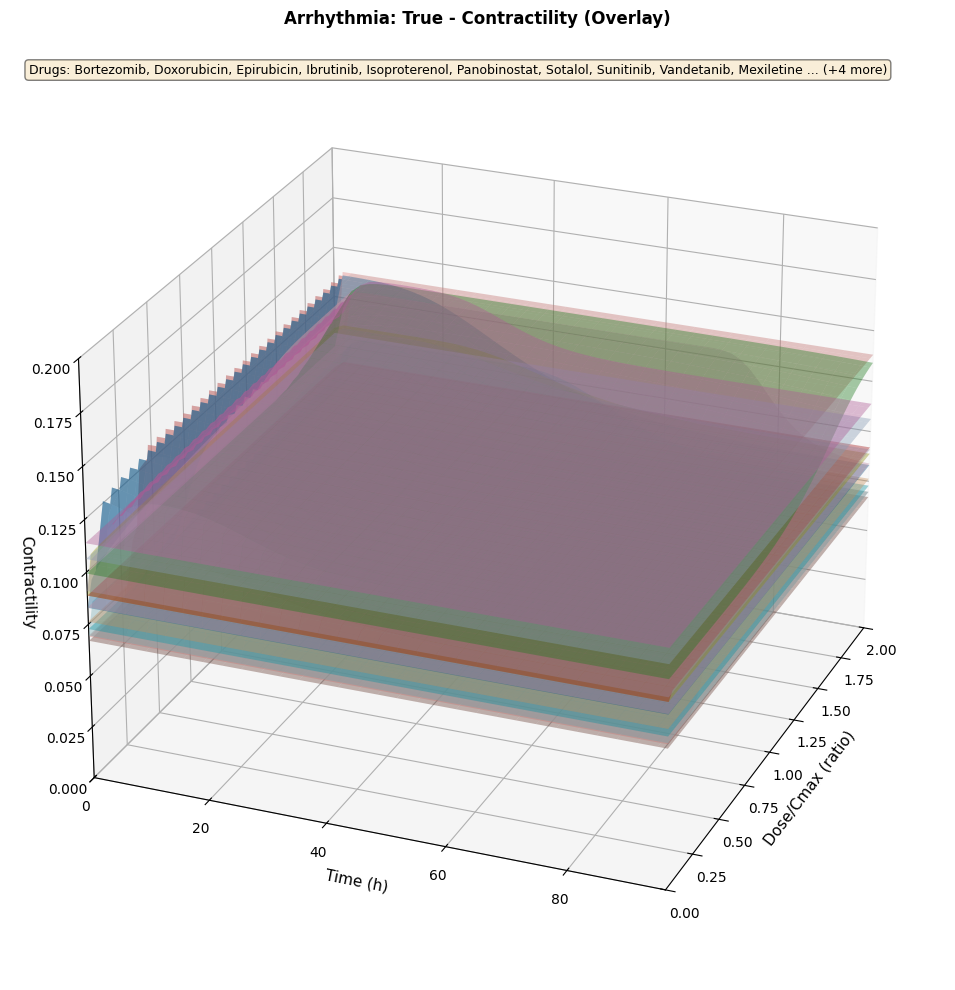

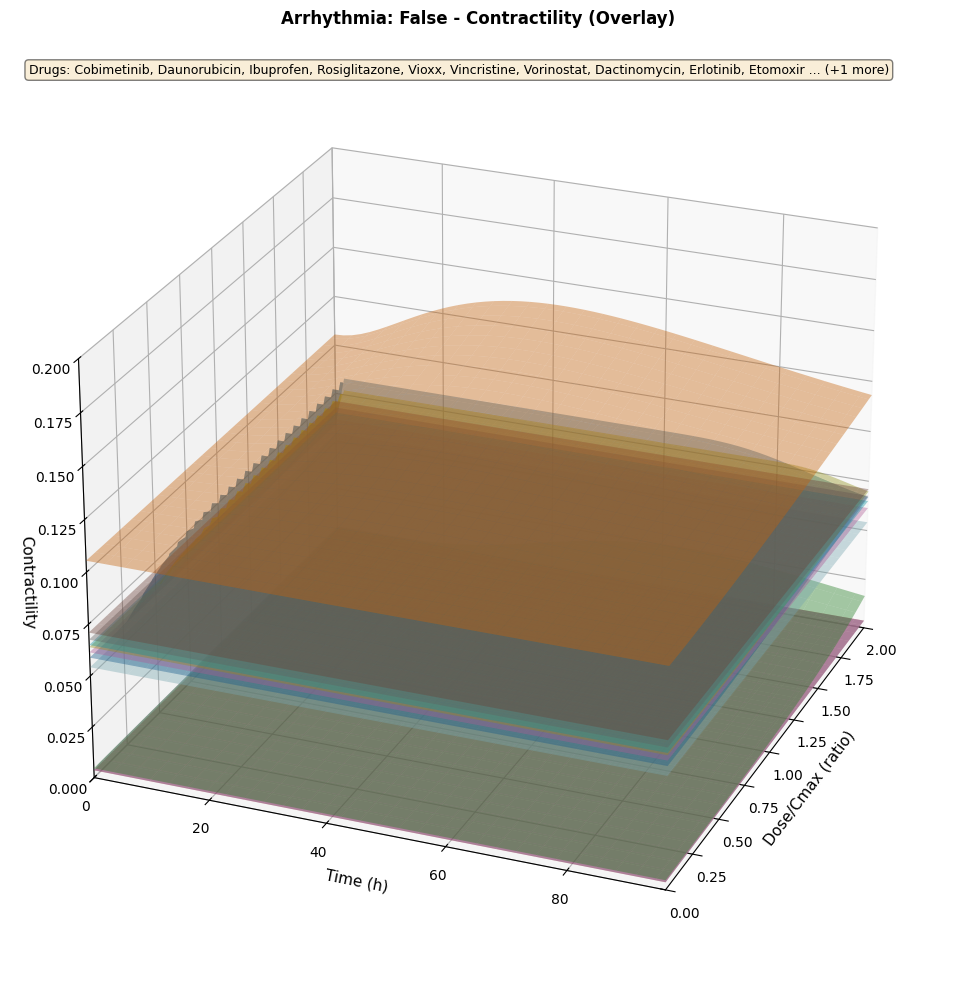

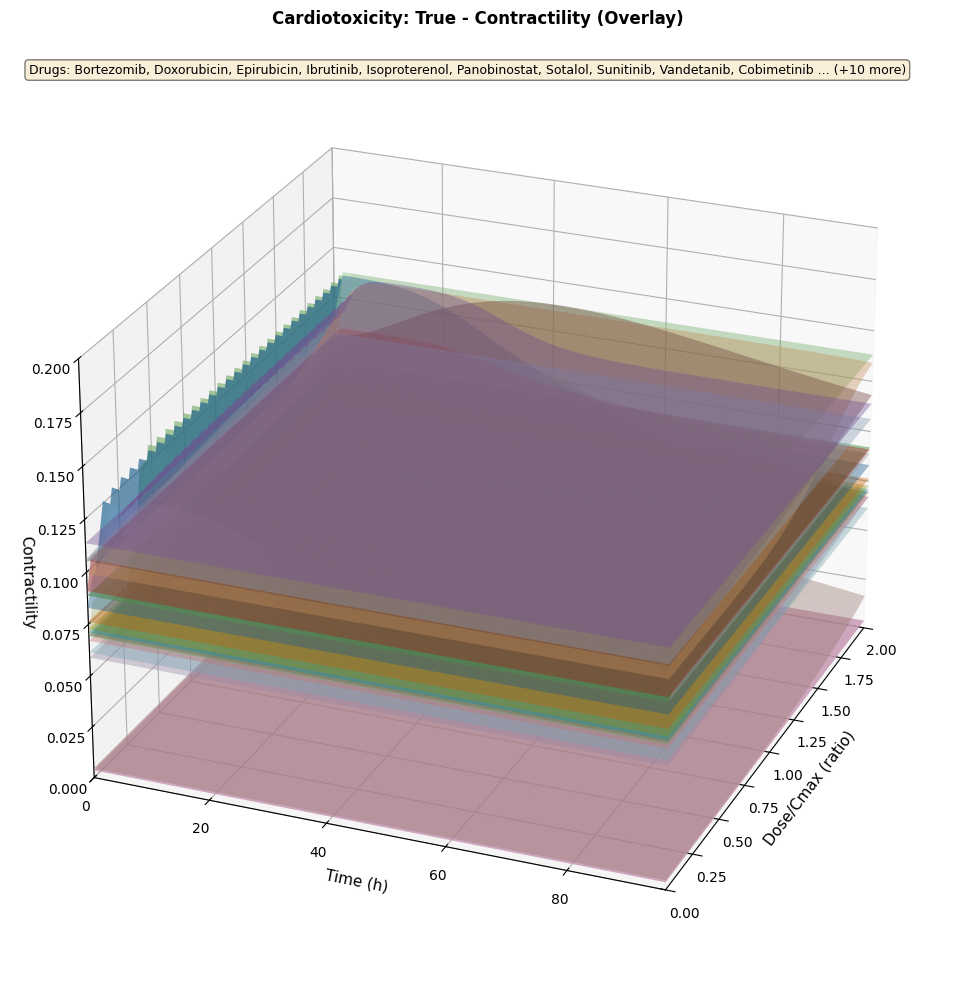

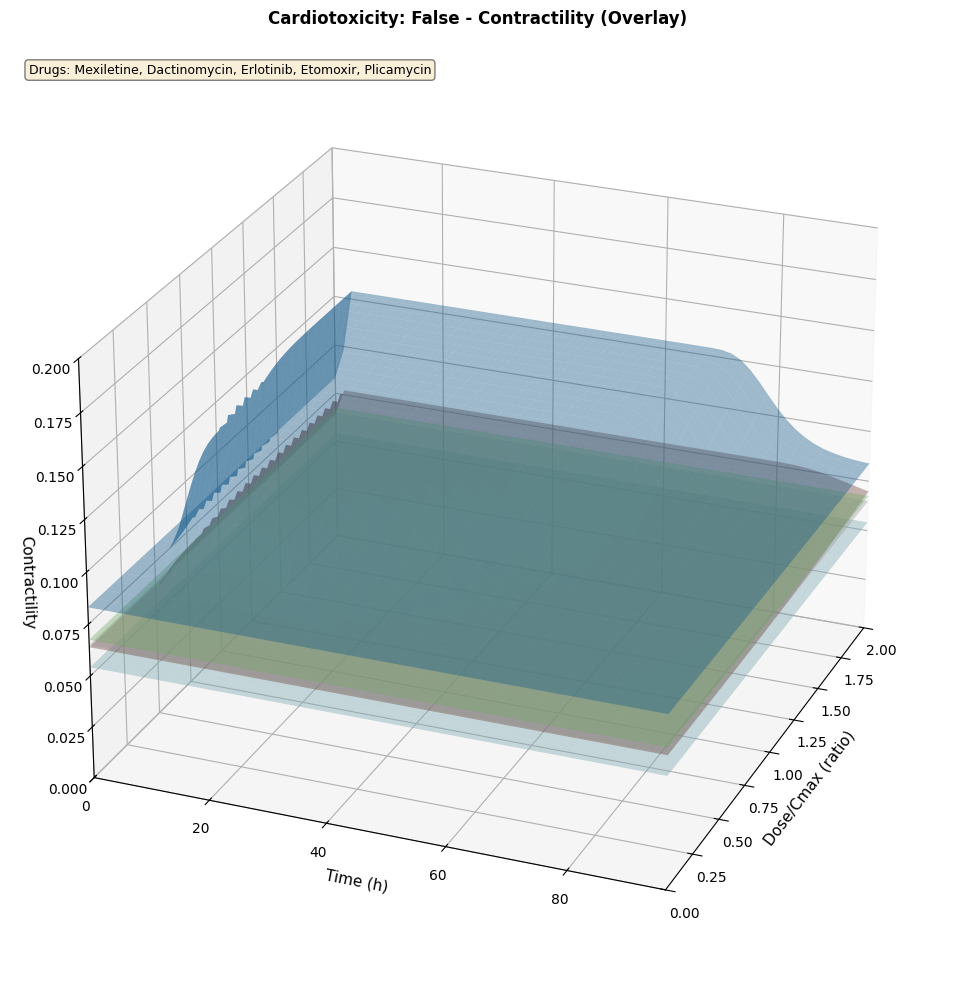

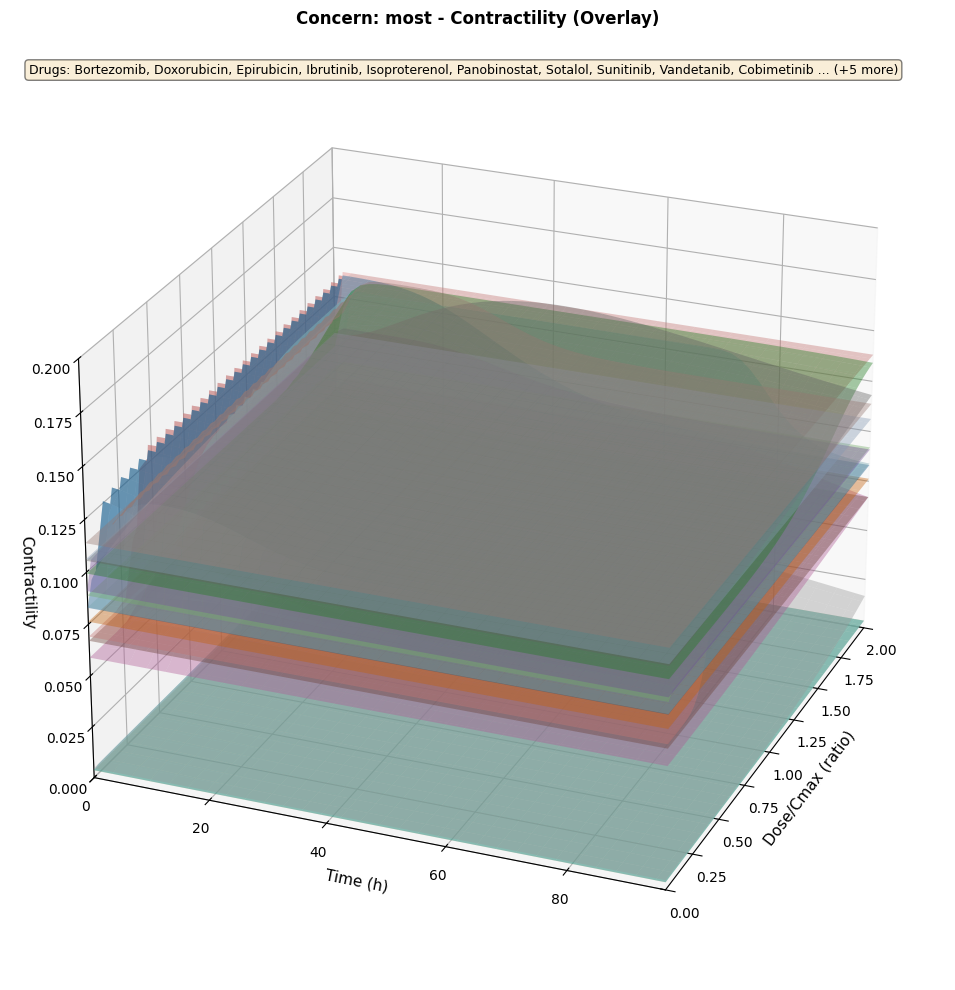

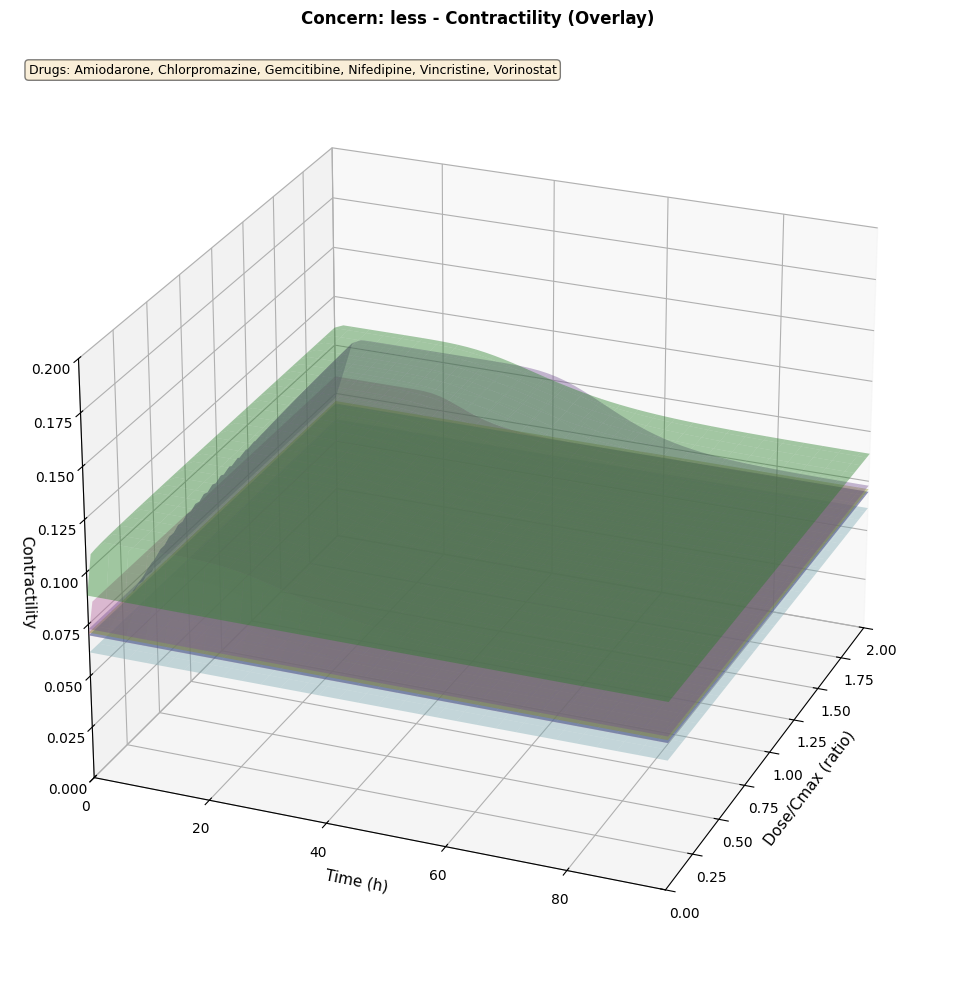

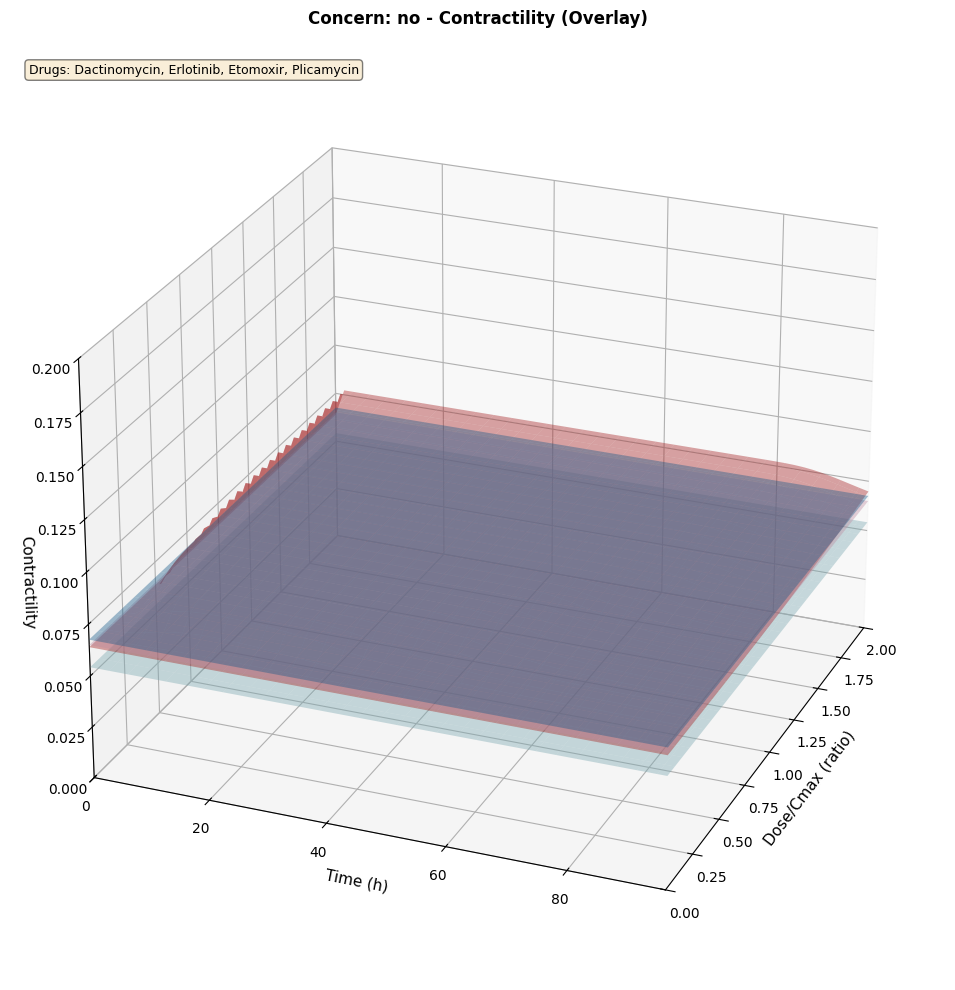

In [ ]:
# Cell 10: Generate Overlay Plots for Contractility
print("="*80)
print("GENERATING OVERLAY PLOTS FOR CONTRACTILITY")
print("="*80)

for cat_type, cat_dict in contractility_groups.items():
    for cat_val, drug_indices in cat_dict.items():
        if len(drug_indices) == 0:
            continue
        
        fig = plt.figure(figsize=(14, 10))
        ax = fig.add_subplot(111, projection='3d')
        
        plot_overlay_surfaces(df_contractility_valid, drug_indices, 'Contractility', 
                             f'{cat_type}: {cat_val}', ax=ax, vmin=contractility_vmin, vmax=contractility_vmax)
        
        plt.tight_layout()
        
        # Store plot for saving later
        safe_name = f"Overlay_{cat_type}_{cat_val}_Contractility"
        safe_name = ''.join(c for c in safe_name if c.isalnum() or c in ('_', '-'))
        output_path = OUTPUT_DIR / f"{safe_name}.png"
        store_plot(fig, output_path)

print("\nContractility overlay plots generated (stored for saving)!")


### Preview: Overlay O2 Plots

Preview sample overlay plots for O2 before saving all.


PREVIEW: SAMPLE OVERLAY O2 PLOTS


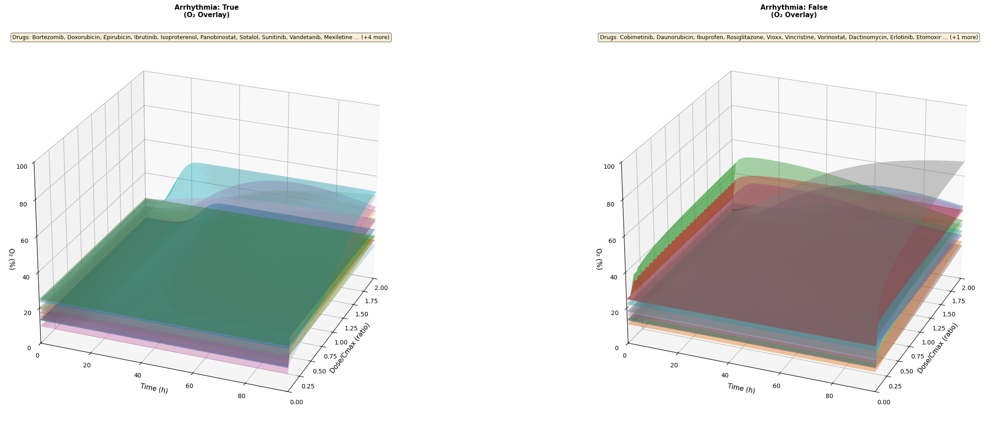


Preview complete. Will save overlay plots for all O2 categories next.
Total categories to save: 75


In [ ]:
# Preview: Sample Overlay O2 Plots
print("="*80)
print("PREVIEW: SAMPLE OVERLAY O2 PLOTS")
print("="*80)

# Find categories with multiple drugs for preview
preview_categories = []
for cat_type, cat_dict in o2_groups.items():
    for cat_val, indices in cat_dict.items():
        if len(indices) >= 2:
            preview_categories.append((cat_type, cat_val, indices))
            if len(preview_categories) >= 2:  # Show 2 previews
                break
    if len(preview_categories) >= 2:
        break

if preview_categories:
    num_preview = len(preview_categories)
    fig, axes = plt.subplots(1, num_preview, figsize=(14*num_preview, 10), 
                             subplot_kw={'projection': '3d'})
    
    if num_preview == 1:
        axes = [axes]
    
    for i, (cat_type, cat_val, drug_indices) in enumerate(preview_categories):
        plot_overlay_surfaces(df_o2_valid, drug_indices, 'O2',
                             f'{cat_type}: {cat_val}', ax=axes[i], vmin=o2_vmin, vmax=o2_vmax)
        axes[i].set_title(f'{cat_type}: {cat_val}\n(O₂ Overlay)', 
                         fontsize=11, fontweight='bold', pad=15)
    
    plt.tight_layout()
    plt.show()
    
    print(f"\nPreview complete. Will save overlay plots for all O2 categories next.")
    print(f"Total categories to save: {sum(len(indices) for cat_dict in o2_groups.values() for indices in cat_dict.values() if len(indices) > 0)}")
else:
    print("No categories with multiple drugs found for preview")


GENERATING OVERLAY PLOTS FOR O2

O2 overlay plots generated (stored for saving)!


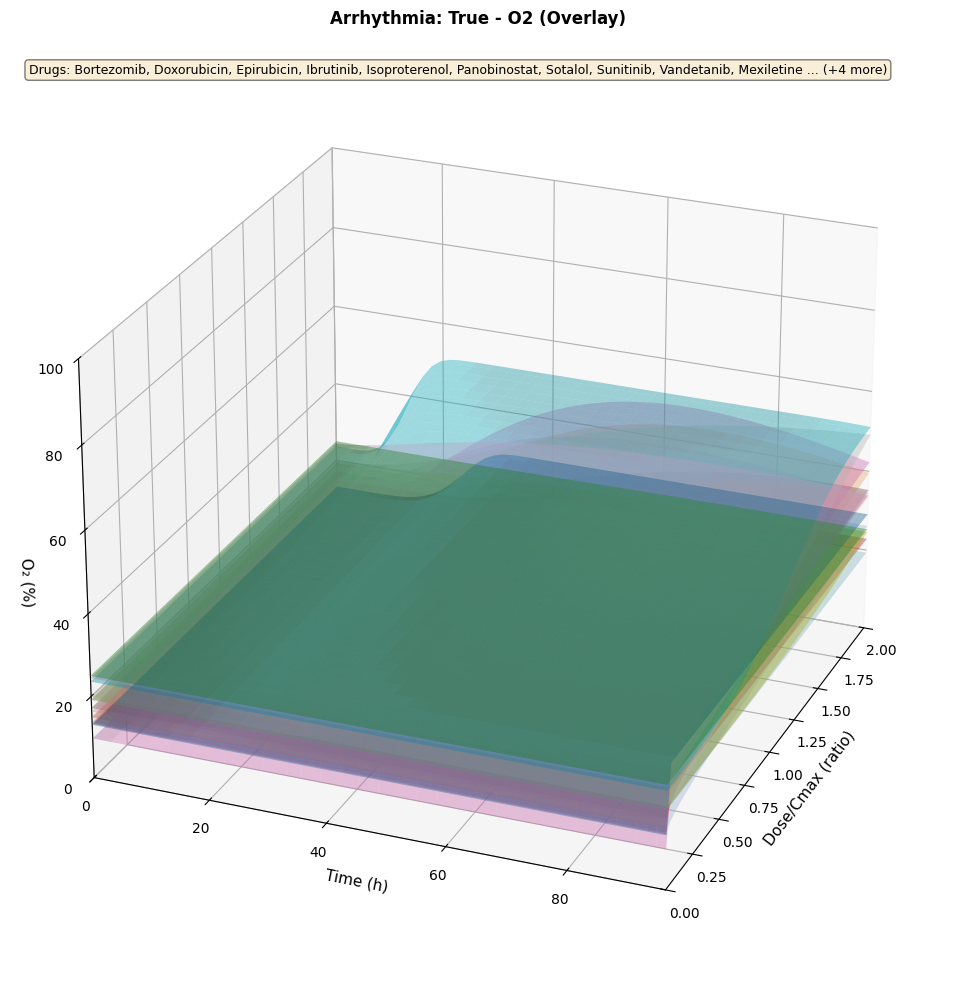

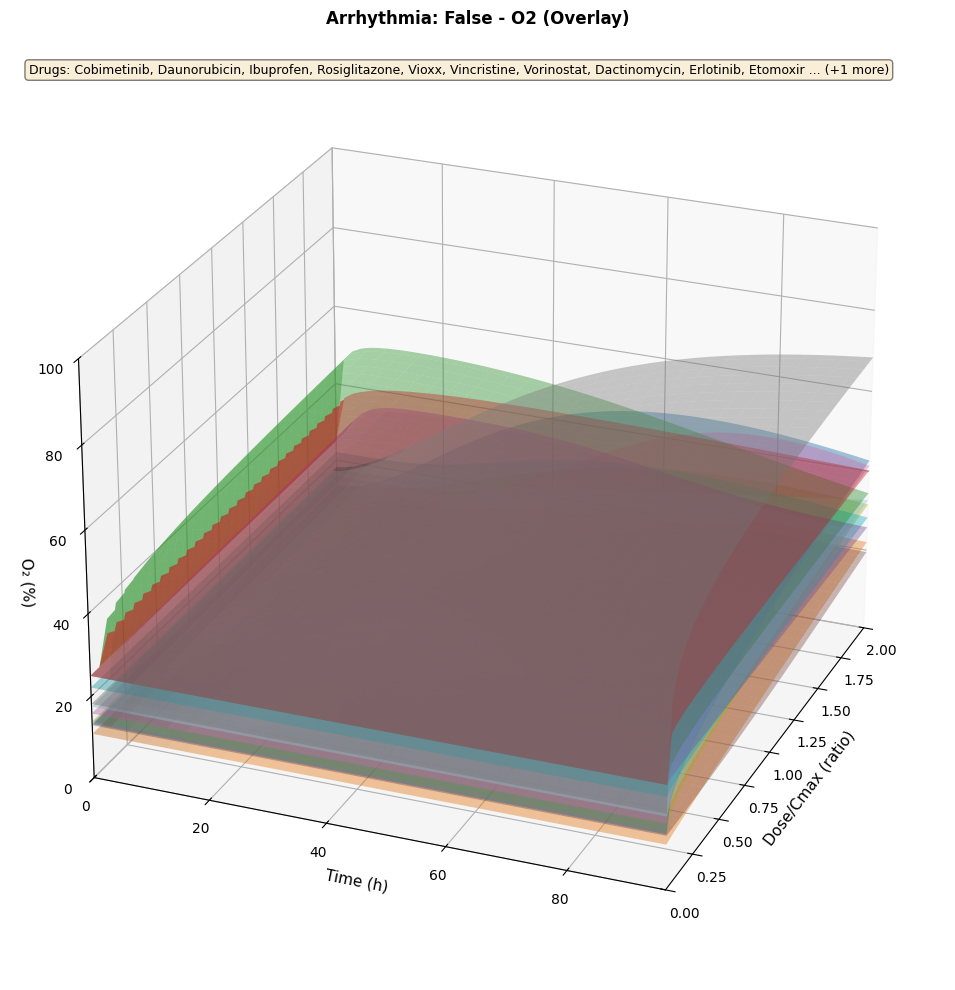

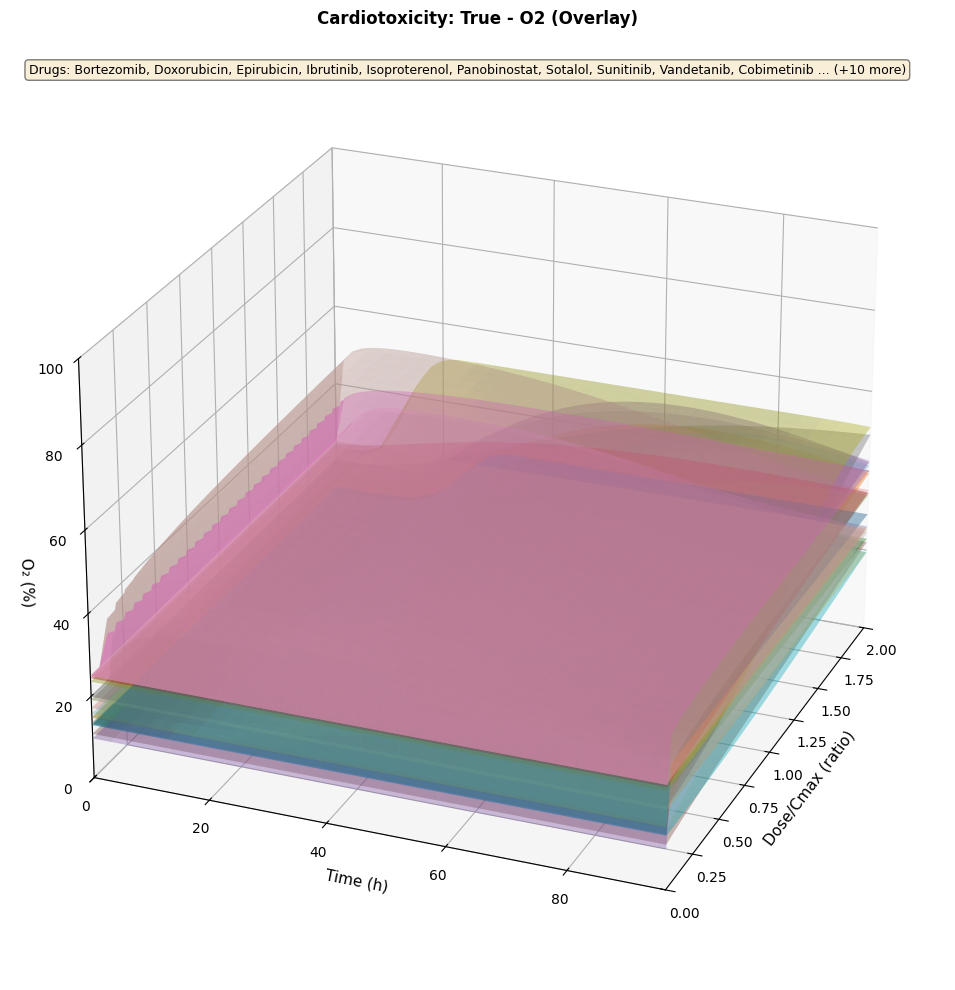

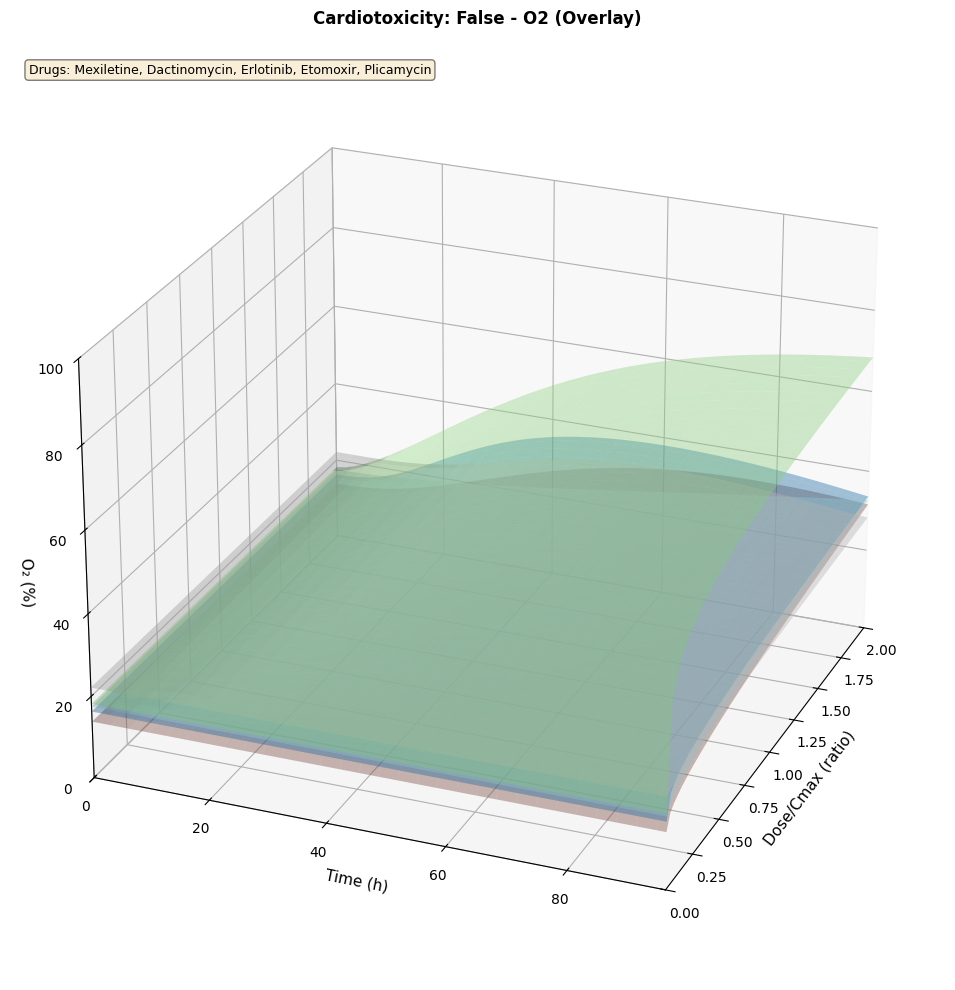

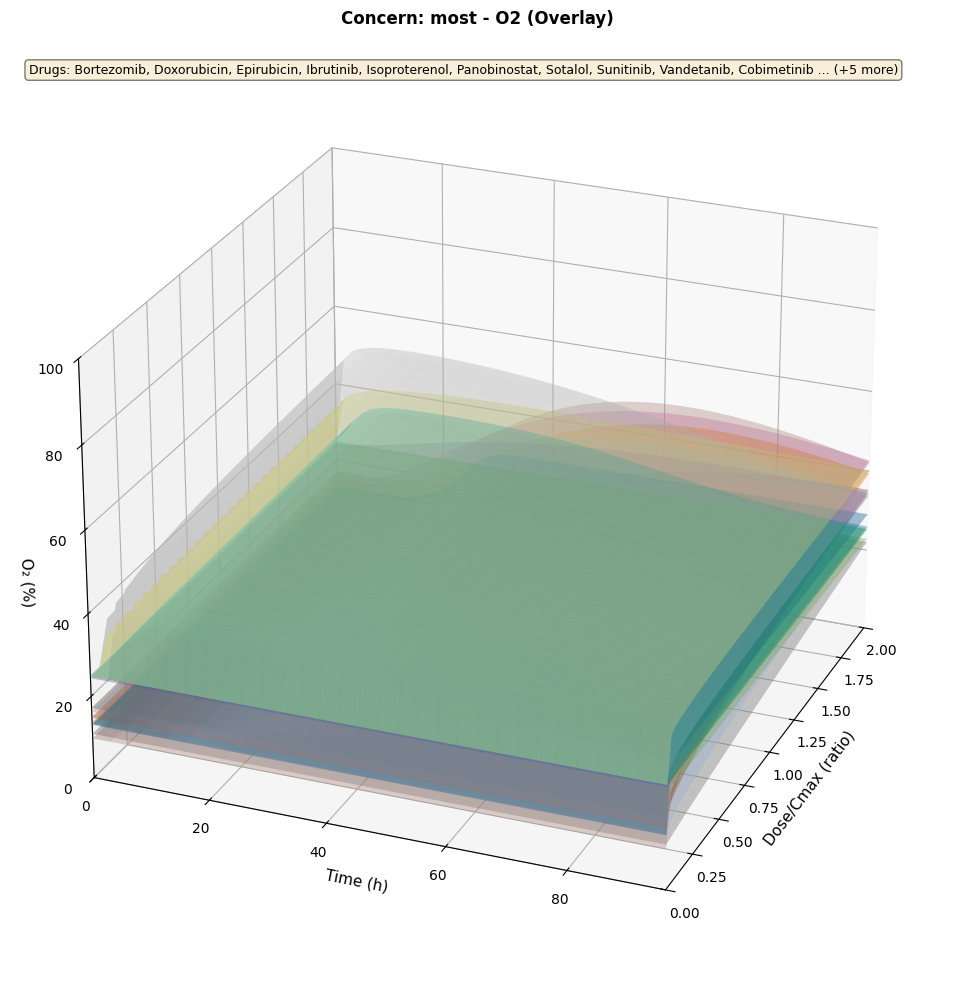

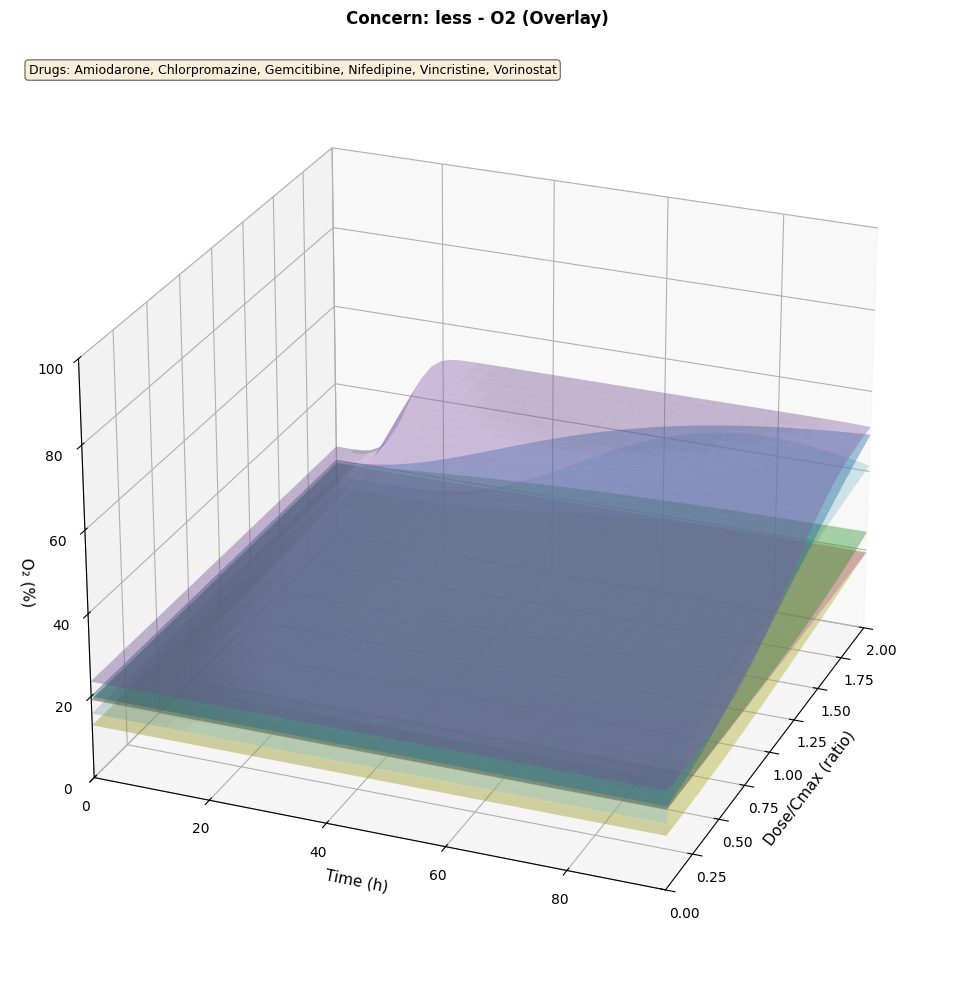

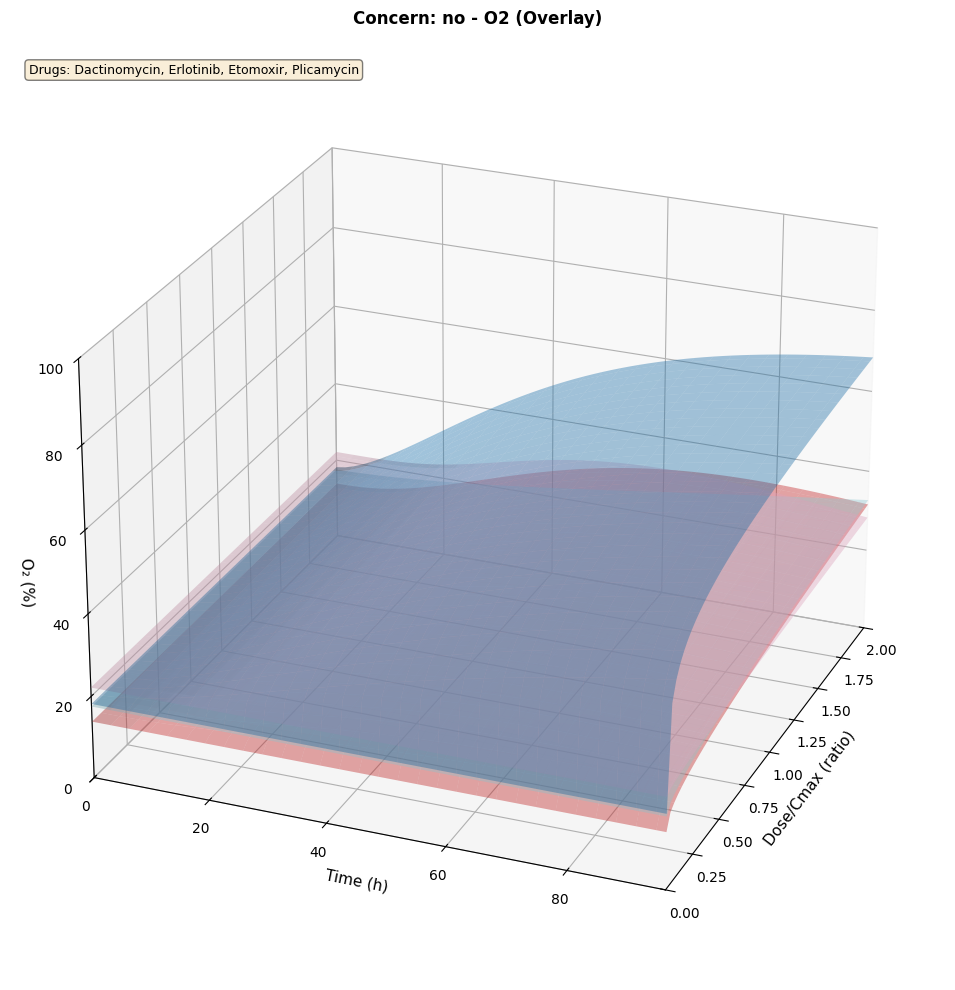

In [ ]:
# Cell 11: Generate Overlay Plots for O2
print("="*80)
print("GENERATING OVERLAY PLOTS FOR O2")
print("="*80)

for cat_type, cat_dict in o2_groups.items():
    for cat_val, drug_indices in cat_dict.items():
        if len(drug_indices) == 0:
            continue
        
        fig = plt.figure(figsize=(14, 10))
        ax = fig.add_subplot(111, projection='3d')
        
        plot_overlay_surfaces(df_o2_valid, drug_indices, 'O2', 
                             f'{cat_type}: {cat_val}', ax=ax, vmin=o2_vmin, vmax=o2_vmax)
        
        plt.tight_layout()
        
        # Store plot for saving later
        safe_name = f"Overlay_{cat_type}_{cat_val}_O2"
        safe_name = ''.join(c for c in safe_name if c.isalnum() or c in ('_', '-'))
        output_path = OUTPUT_DIR / f"{safe_name}.png"
        store_plot(fig, output_path)

print("\nO2 overlay plots generated (stored for saving)!")


## Step 8: Display Sample Plots

Display a few sample plots interactively.



Sample Overlay Plot:


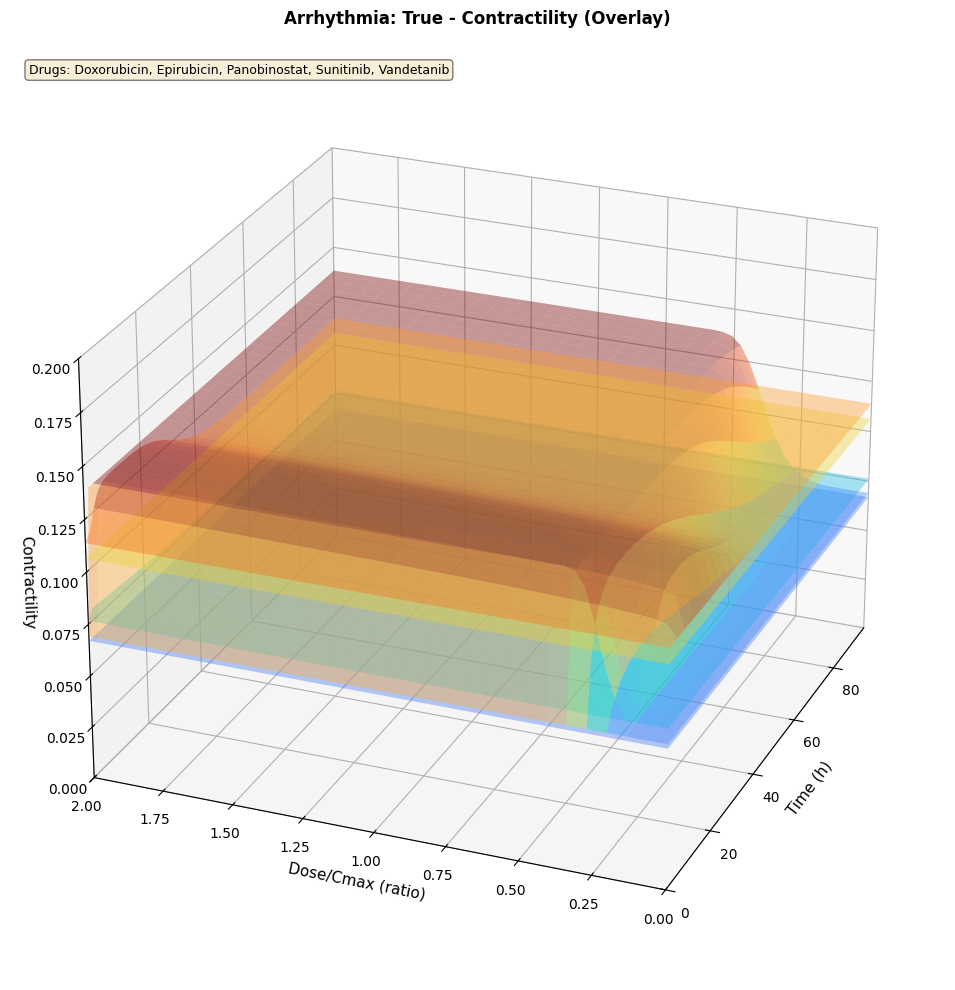


Displayed overlay plot for Arrhythmia: True
Showing 5 of 5 drugs


In [ ]:
# Cell 13: Display Sample Overlay Plot
print("\nSample Overlay Plot:")

# Find a category with multiple drugs for demonstration
overlay_category = None
overlay_value = None
overlay_indices = None

for cat_type, cat_dict in contractility_groups.items():
    for cat_val, indices in cat_dict.items():
        if len(indices) >= 2:
            overlay_category = cat_type
            overlay_value = cat_val
            overlay_indices = indices
            break
    if overlay_indices:
        break

if overlay_indices:
    fig = plt.figure(figsize=(14, 10))
    ax = fig.add_subplot(111, projection='3d')
    
    plot_overlay_surfaces(df_contractility_valid, overlay_indices[:5], 'Contractility',
                         f'{overlay_category}: {overlay_value}', ax=ax, vmin=contractility_vmin, vmax=contractility_vmax)
    
    plt.tight_layout()
    plt.show()
    print(f"\nDisplayed overlay plot for {overlay_category}: {overlay_value}")
    print(f"Showing {min(5, len(overlay_indices))} of {len(overlay_indices)} drugs")
else:
    print("No category with multiple drugs found for overlay demonstration")


## Step 9: 2D Projection Plots

Create 2D projection plots showing:
- Response vs Time (at fixed concentrations)
- Response vs Concentration (at fixed times)

For each category, showing overlays of all drugs in that category.


### Preview: 2D Projection Plots

Preview sample 2D projection plots before generating all plots.


## Step 10: Save All Plots

Save all generated plots to disk, one after another.


In [ ]:
# Dependencies: Cell 1 (imports), Cell 13 (store_plot function, plots_to_save list)
# Cell 35: Save All Plots
print("="*80)
print("SAVING ALL PLOTS")
print("="*80)

# Ensure output directory exists
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

# Check if there are plots to save
if len(plots_to_save) == 0:
    print("No plots to save. Make sure you've run the plotting cells first.")
else:
    print(f"Total plots to save: {len(plots_to_save)}\n")
    
    saved_count = 0
    error_count = 0
    
    for i, (fig, output_path) in enumerate(plots_to_save, 1):
        try:
            # Ensure parent directory exists
            output_path.parent.mkdir(parents=True, exist_ok=True)
            
            # Save the figure
            fig.savefig(output_path, dpi=300, bbox_inches='tight', facecolor='white')
            
            # Close figure immediately to free memory
            plt.close(fig)
            
            saved_count += 1
            if i % 10 == 0 or i == len(plots_to_save):
                print(f"  [{i}/{len(plots_to_save)}] Saved: {output_path.name}")
        except Exception as e:
            error_count += 1
            print(f"  [{i}/{len(plots_to_save)}] Error saving {output_path.name}: {e}")
            # Make sure to close the figure even on error
            try:
                plt.close(fig)
            except:
                pass
    
    print(f"\n{'='*80}")
    print(f"Save complete: {saved_count} plots saved, {error_count} errors")
    print(f"Output directory: {OUTPUT_DIR}")
    print(f"{'='*80}")


SAVING ALL PLOTS
Total plots to save: 22

  [10/22] Saved: Etomoxir_O2.png
  [20/22] Saved: Erlotinib_Contractility.png
  [22/22] Saved: Plicamycin_Contractility.png

Save complete: 22 plots saved, 0 errors
Output directory: c:\Users\NoahB\Documents\MATLAB\ml_pipeline\outputs\plots\pkpd_elimination\3d_surfaces


In [ ]:
# Generate 2D Projection Plots for O2
print("="*80)
print("GENERATING 2D PROJECTION PLOTS FOR O2")
print("="*80)


for cat_type, cat_dict in o2_groups.items():
    for cat_val, drug_indices in cat_dict.items():
        if len(drug_indices) == 0:
            continue
        
        category_name = f'{cat_type}: {cat_val}'
        
        # Create figure with 2 subplots: Time and Concentration projections
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 7))
        
        # Plot 1: O2 vs Time (at fixed concentrations)
        plot_2d_projection_overlay(df_o2_valid, drug_indices, 'O2',
                                   category_name, projection_type='time', ax=ax1)
        
        # Plot 2: O2 vs Concentration (at fixed times)
        plot_2d_projection_overlay(df_o2_valid, drug_indices, 'O2',
                                   category_name, projection_type='concentration', ax=ax2)
        
        plt.tight_layout()
        
        # Store plot for saving later
        safe_name = f"Projection_{cat_type}_{cat_val}_O2"
        safe_name = ''.join(c for c in safe_name if c.isalnum() or c in ('_', '-'))
        output_path = OUTPUT_DIR / f"{safe_name}.png"
        store_plot(fig, output_path)

print("\nO2 2D projection plots generated (stored for saving)!")


## Summary

All plots have been generated and saved to:
- **Output Directory:** `Output/3D_Plots/`

**Generated plots:**
- Individual 3D surface plots for each drug (Contractility and O2)
- Overlay plots showing all drugs in each category:
  - Arrhythmia (True/False)
  - Cardiotoxicity (True/False)
  - Concern (most/less/no)

**Plot specifications:**
- X-axis: Dose/Cmax ratio (0 to 2)
- Y-axis: Time (0 to 96 hours)
- Z-axis: Response (Contractility: 0-0.2, O2: 0-100%)
- View angle: elev=25°, azim=-158° (matching MATLAB)
- Colormap: turbo (for individual plots)
